# COGS 189 Find Triggers

In [1]:
import numpy as np   
import matplotlib.pyplot as plt    
import pandas as pd

from scipy.io.wavfile import read

import os
# import mne

# import wave
# import sys
from scipy.signal import find_peaks, convolve

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

// This disables scrolling outputs

<IPython.core.display.Javascript object>

# Import data for one subject
Combine data from all subjects for a selected experiment into a single data frame.

In [3]:
from glob import glob

# Specify experiment folder to read from
#exp = 'exp0'
exp = 'exp1'

# Subject ID here essentially selects a data file from the folder
subject_ID = 0
#subject_ID = 1

# Grab all data files for that experiment
data_files = glob("../data/" + exp + "/**/OpenBCI*.txt", recursive=True)

# Get one file (corresponding to one subject)
file_path = data_files[subject_ID]
print(f'Subject{subject_ID}')
print(f'Reading {file_path}')

# Read in one subject's data
data = pd.read_csv(file_path,
                   delimiter = ',', # BrainFlow files appear to use \t
                   header=4, # row number of col names
                  )

# Display
data

Subject0
Reading ../data/exp1/OpenBCISession_2023-03-10_13-20-40/OpenBCI-RAW-2023-03-10_14-05-08.txt


,Sample Index,EXG Channel 0,EXG Channel 1,EXG Channel 2,EXG Channel 3,EXG Channel 4,EXG Channel 5,EXG Channel 6,EXG Channel 7,Accel Channel 0,...,Other.3,Other.4,Other.5,Other.6,Analog Channel 0,Analog Channel 1,Analog Channel 2,Timestamp,Other.7,Timestamp (Formatted)
0,220.0,-7432.826749,-21299.983120,7262.707622,-29367.957040,-19525.411072,-24531.978313,-25757.256241,-16991.840838,0.0,...,3.0,116.0,2.0,114.0,615.0,884.0,626.0,1.678486e+09,0.0,2023-03-10 14:05:08.129
1,221.0,-7446.081334,-21308.655597,7248.961300,-29382.664488,-19536.162262,-24547.401017,-25771.561357,-17000.669777,0.0,...,3.0,114.0,2.0,115.0,615.0,882.0,627.0,1.678486e+09,0.0,2023-03-10 14:05:08.129
2,222.0,-7446.863645,-21305.973387,7244.178026,-29392.052220,-19540.453796,-24555.246479,-25775.115284,-17003.284932,0.0,...,3.0,116.0,2.0,115.0,615.0,884.0,627.0,1.678486e+09,0.0,2023-03-10 14:05:08.129
3,223.0,-7450.104648,-21308.566190,7231.638698,-29404.546846,-19546.578174,-24564.097770,-25781.329069,-17009.811641,0.0,...,3.0,115.0,2.0,115.0,615.0,883.0,627.0,1.678486e+09,0.0,2023-03-10 14:05:08.129
4,224.0,-7458.084221,-21311.069585,7220.753398,-29416.482677,-19553.440160,-24571.116218,-25787.989889,-17013.946714,0.0,...,3.0,115.0,2.0,115.0,615.0,883.0,627.0,1.678486e+09,0.0,2023-03-10 14:05:08.129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
470122,101.0,-7566.624292,-20868.505045,7156.112153,-30442.025416,-17178.746126,-19158.060152,-21497.617244,-10815.964438,0.0,...,3.0,115.0,2.0,115.0,614.0,883.0,627.0,1.678488e+09,0.0,2023-03-10 14:36:28.321
470123,102.0,-7577.487240,-20878.004536,7141.471760,-30457.068140,-17191.196047,-19169.414838,-21499.070108,-10833.465854,0.0,...,3.0,115.0,2.0,115.0,614.0,883.0,627.0,1.678488e+09,0.0,2023-03-10 14:36:28.321
470124,103.0,-7580.683539,-20878.295109,7145.472723,-30453.491861,-17187.262140,-19162.798722,-21501.506448,-10820.591250,0.0,...,3.0,115.0,2.0,115.0,615.0,883.0,627.0,1.678488e+09,0.0,2023-03-10 14:36:28.321
470125,104.0,-7568.859466,-20866.851016,7159.889598,-30429.821364,-17160.596509,-19152.807492,-21489.257692,-10796.384310,0.0,...,3.0,115.0,2.0,115.0,615.0,883.0,627.0,1.678488e+09,0.0,2023-03-10 14:36:28.328


# Simplify Column Names

In [4]:
print(data.keys())

# Remove extra spaces from col names, and remove "Channel" as its redundant
# https://stackoverflow.com/questions/21606987/how-can-i-strip-the-whitespace-from-pandas-dataframe-headers
data = data.rename(columns=lambda x: x.strip().replace(" Channel ", ""))

print(data.keys())

Index(['Sample Index', ' EXG Channel 0', ' EXG Channel 1', ' EXG Channel 2',
       ' EXG Channel 3', ' EXG Channel 4', ' EXG Channel 5', ' EXG Channel 6',
       ' EXG Channel 7', ' Accel Channel 0', ' Accel Channel 1',
       ' Accel Channel 2', ' Other', ' Other.1', ' Other.2', ' Other.3',
       ' Other.4', ' Other.5', ' Other.6', ' Analog Channel 0',
       ' Analog Channel 1', ' Analog Channel 2', ' Timestamp', ' Other.7',
       ' Timestamp (Formatted)'],
      dtype='object')
Index(['Sample Index', 'EXG0', 'EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG5', 'EXG6',
       'EXG7', 'Accel0', 'Accel1', 'Accel2', 'Other', 'Other.1', 'Other.2',
       'Other.3', 'Other.4', 'Other.5', 'Other.6', 'Analog0', 'Analog1',
       'Analog2', 'Timestamp', 'Other.7', 'Timestamp (Formatted)'],
      dtype='object')


# Drop unused columns

In [5]:
# data = data.drop(columns=['temp', 'time0'])
#data = data.drop(columns=['temp', 'time0', 'time1'])

drop_cols = [] # list of column labels to drop
for col in data.keys():
    # print(col)
    if 'Other' in col:
        drop_cols.append(col)
    elif 'Accel' in col:
        drop_cols.append(col)
    elif 'Timestamp (Formatted)' in col:
        drop_cols.append(col)
    elif 'Sample Index' in col: # keeps wrapping between 0-255, not sure how to use
        drop_cols.append(col)
        
print('Columns to drop:', drop_cols)

# Remove 
data = data.drop(columns=drop_cols)

print('Remaining cols:\n', data.keys())

Columns to drop: ['Sample Index', 'Accel0', 'Accel1', 'Accel2', 'Other', 'Other.1', 'Other.2', 'Other.3', 'Other.4', 'Other.5', 'Other.6', 'Other.7', 'Timestamp (Formatted)']
Remaining cols:
 Index(['EXG0', 'EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG5', 'EXG6', 'EXG7',
       'Analog0', 'Analog1', 'Analog2', 'Timestamp'],
      dtype='object')


# Plot Analog (Aux) Channels

Analog0 Min: 80.0
Analog0 Max: 625.0
Analog1 Min: 75.0
Analog1 Max: 907.0
Analog2 Min: 496.0
Analog2 Max: 919.0


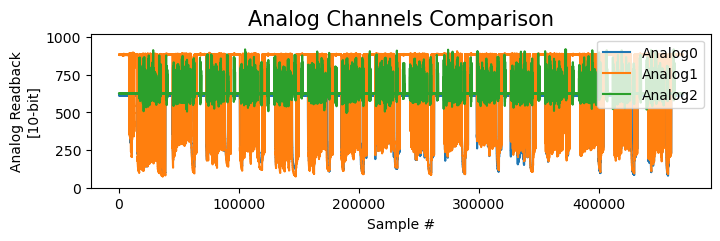

In [6]:
START_NDX = 100 # why skip initial samples?

# Make a figure to plot all analog data
plt.figure(figsize=(8,2))

for col in data.keys():
    if 'Analog' in col:
        print(f"{col} Min: {data[col][START_NDX:].min()}")
        print(f"{col} Max: {data[col][START_NDX:].max()}")
        
        # add a plot for this channel
        plt.plot(data[col][START_NDX:], label=col)


plt.title("Analog Channels Comparison", fontsize=15)
plt.legend(loc="upper right")
plt.xlabel('Sample #')
plt.ylabel('Analog Readback\n[10-bit]')
plt.ylim([0, 1023])
plt.show()

# Attempt to find the starting sample of the experiment

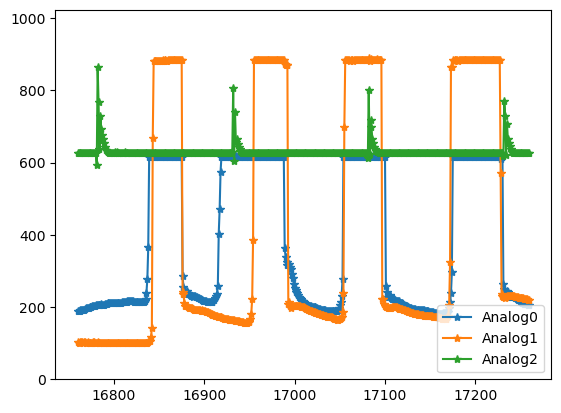

In [7]:
#TARGET_NDX = 4320 # leave some room to prevent overlapping peaks
TARGET_NDX = 16760
DURATION_NDX = 250*2

for ch in range(3):
    ch_name = f'Analog{ch}'
    ch_data = data[ch_name].iloc[TARGET_NDX:TARGET_NDX + DURATION_NDX]
    plt.plot(ch_data, '*-', label=ch_name)
    
plt.ylim([0, 1023])
plt.legend(loc='lower right')

# Add triggers to a stim channel

## Import PsychoPy Logs

In [8]:
# Get the directory containing the current dataframe's data
subject_dir = '/'.join(file_path.split('/')[:-1])

# Grab all data files for that experiment
psychopy_csv_path = glob(subject_dir + "/psychopy_data/*.csv", recursive=True)[0]

print(f'Reading {psychopy_csv_path}...')

# Read in one subject's data
psychopy_data = pd.read_csv(psychopy_csv_path,
                            delimiter = ',', # BrainFlow files appear to use \t
                            # header=4, # row number of col names
                           )

for col in psychopy_data.keys():
    print(col)

Reading ../data/exp1/OpenBCISession_2023-03-10_13-20-40/psychopy_data/sash_untitled_2023-03-10_14h05.41.985.csv...
stimuli_name
Repeat_experiment.thisRepN
Repeat_experiment.thisTrialN
Repeat_experiment.thisN
Repeat_experiment.thisIndex
trials.thisRepN
trials.thisTrialN
trials.thisN
trials.thisIndex
Repeat_Train.thisRepN
Repeat_Train.thisTrialN
Repeat_Train.thisN
Repeat_Train.thisIndex
Introduction.started
Introduction.stopped
listen_instr.started
key_continue.started
key_continue.keys
key_continue.rt
cross.started
Put_hands.started
Listening_Tap_Instruction_3.started
cue.started
cross_listen.started
beat1.started
cue.stopped
cross_listen.stopped
Tap_Imagine_instruction_2.started
Tap_Imagine_instruction_2.stopped
cue_tap_imagine.started
cross_imagine.started
cue_tap_imagine.stopped
cross_imagine.stopped
Imagine_instruction_2.started
cue_imagine.started
cross_imagine_2.started
Instruction_next_trial.started
cue_imagine.stopped
Imagine_instruction_2.stopped
cross_imagine_2.stopped
Instruc

## Assign event (trigger) labels based on stimuli files used
Exp1 consists of multiple conditions and stimuli files.
  
Each trial is preceded by a metronome / cue segment. It is unclear if the subject would have tapped here or not (represented below as '?'):

Auditory | Motor | Motor Imagery | Associated Task | Leads into
:-- | :-- | :-- | :-- | :--
✓ | ? | ? | 'cue.started' | 'beat1.started'
✓ | ? | ? | 'cue_tap_imagine.started' | 'cue_tap_imagine.stopped'
✓ | ? | ? | 'cue_imagine.started' | 'cue_imagine.stopped'

The actual trials following the cue segments are randomized among the following three conditions. It is assumed that all conditions have an underlying imagery component. Motor-action (tapping) and auditory-listening are added for other conditions:

Auditory | Motor | Motor Imagery | Associated Task | Description
:-- | :-- | :-- | :-- |  :--
✓ | ✓ | ✓ | 'beat1.started' | Listening trial begins
  | ✓ | ✓ | 'cue_tap_imagine.stopped' | Tapping trial begins
  |   | ✓ | 'cue_imagine.stopped' | Imagery trial begins

Trigger labels are somewhat involved, and we might be able to come up with a better schema. For now, the triggers are three digit decimals, with:
- 100th place encoding the condition
- 10th place encoding the rhythm/patter
- 1th place encoding the trigger (played sound or tapping response)

100th | 10th | 1th | Description
:-- | :-- | :-- | :--
0 | * | * | condition: 'cue.started'
1 | * | * | condition: 'beat1.started'
2 | * | * | condition: 'cue_tap_imagine.started'
3 | * | * | condition: 'cue_tap_imagine.stopped'
4 | * | * | condition: 'cue_imagine.started'
5 | * | * | condition: 'cue_imagine.stopped'
\* | 0 | * | rhythm: isochronous 
\* | 1 | * | rhythm: syncopated (easier, mp1-derivative) 
\* | 2 | * | rhythm: syncopated (harder, mp2-derivative) 
\* | * | 1 | trigger: sound: loud cue, start of trial
\* | * | 2 | trigger: sound: loud cue (second)
\* | * | 3 | trigger: sound: soft cue
\* | * | 4 | trigger: sound: snare 
\* | * | 7 | trigger: tap (Analog0 neg-edge)
\* | * | 8 | trigger: tap (Analog1 neg-edge)

## Assign 'stim' labels for each wav used

In [9]:
stim_labels = {}

# include cue
stim_labels['audio/exp1/cue.wav'] = 1

# go through all the logged stimuli
stim_paths = psychopy_data['stimuli_name'].dropna().unique()
stim_paths.sort()

# label = 10 # arbitrary, label>=10 would represent some stim file here
label = 10 # since these are snare triggers, but stim sounds, bpm, and note patterns are different
for stim_path in stim_paths:
    stim_labels[stim_path] = label
    label += 10

stim_labels

{'audio/exp1/cue.wav': 1,
 'audio/exp1/snare_iso.wav': 10,
 'audio/exp1/snare_mp1.wav': 20,
 'audio/exp1/snare_mp2.wav': 30}

## Get duration for each stim from wav file

In [10]:
stim_duration = {}
for stim_path in stim_labels:
    fs, stim_wav = read(r'../stim/' + stim_path)
    duration = len(stim_wav)/fs
    stim_duration[stim_path] = duration
    
print(stim_duration)

{'audio/exp1/cue.wav': 4.8, 'audio/exp1/snare_iso.wav': 9.6, 'audio/exp1/snare_mp1.wav': 9.6, 'audio/exp1/snare_mp2.wav': 9.6}


## Assign trigger labels for each trial condition

In [11]:
cue_conditions = [
    #'stimuli_name', 
    'cue.started',
    #'beat1.started',    # listen+tap started
    'cue_tap_imagine.started',
    #'cue_tap_imagine.stopped', # tap started
    'cue_imagine.started',
    #'cue_imagine.stopped', # imagery started
]

beat_conditions = [
    #'stimuli_name', 
    #'cue.started',
    'beat1.started',    # listen+tap started
    #'cue_tap_imagine.started',
    'cue_tap_imagine.stopped', # tap started
    #'cue_imagine.started',
    'cue_imagine.stopped', # imagery started
]

# ordering needs to match psychopy column order
all_conditions = [
    'stimuli_name', 
    'cue.started',
    'beat1.started',    # listen+tap started
    'Tap_Imagine_instruction_2.started', # flag for end of training
    'cue_tap_imagine.started',
    'cue_tap_imagine.stopped', # tap started
    'cue_imagine.started',
    'cue_imagine.stopped', # imagery started
]

condition_labels = {}
label = 0
for c in all_conditions:
    if (c!='stimuli_name') and (c!='Tap_Imagine_instruction_2.started'):
        condition_labels[c] = label
        label += 100
    else:
        condition_labels[c] = -999 # unused
    
condition_labels

{'stimuli_name': -999,
 'cue.started': 0,
 'beat1.started': 100,
 'Tap_Imagine_instruction_2.started': -999,
 'cue_tap_imagine.started': 200,
 'cue_tap_imagine.stopped': 300,
 'cue_imagine.started': 400,
 'cue_imagine.stopped': 500}

In [12]:
cols = ['stimuli_name']
cols.extend(all_conditions)
print(len(cols), cols)

psychopy_data_conditions = psychopy_data[cols]

9 ['stimuli_name', 'stimuli_name', 'cue.started', 'beat1.started', 'Tap_Imagine_instruction_2.started', 'cue_tap_imagine.started', 'cue_tap_imagine.stopped', 'cue_imagine.started', 'cue_imagine.stopped']


In [13]:
num_cols = len(cols)
triggers = []
START_TIME = []
TRAIN_LOOPS = 4

for row_idx, row in psychopy_data_conditions.iterrows():
    #print(row_idx)
    #print(row)
    stim_path = row[0] # first col gets wav name
    training_loops = True # assume we are in a training segment until we reach 'Tap_Imagine_instruction_2.started'
    
    if not (pd.isnull(stim_path)): # valid rows appear to start with stim path
        for col_idx in range(1, num_cols):
            condition = cols[col_idx]
            time_onset = row[col_idx] # each segment's event time
            label = condition_labels[condition]
            
            # check if training loops have ended
            if (condition == 'Tap_Imagine_instruction_2.started') and (not pd.isnull(time_onset)):
                training_loops = False
                # print('Training loops ended')
                    
            # Only process events with positive labels
            if label >= 0:
                
                # get psychopy's start time, offset remaining times
                if START_TIME == []: # set t=0 here
                    START_TIME = time_onset
                    time_onset = 0
                else:
                    time_onset -= START_TIME

                # correct stim path for cue segments, and fix any missing '*.stopped' events
                if condition in cue_conditions:
                    stim_path = 'audio/exp1/cue.wav' # update stim path to be cue 
                elif (condition in beat_conditions):
                    stim_path = row[0] # reset just in case preceded by cue
                    label += stim_labels[stim_path] # offset label by syncopation

                    # some '*.stopped' events are missing psychopy times...why?
                    if (not training_loops) and ('stopped' in condition) and (pd.isnull(time_onset)):
                        # use preceding cue's onset and extend by cue's duration
                        time_onset = ev[0] + stim_duration['audio/exp1/cue.wav']
                        print(f'>> {condition} was missing onset time!! Assigned {time_onset}')

                # Now collect events with valid (or fixed) onset times:
                if not(pd.isnull(time_onset)) and (condition != 'Tap_Imagine_instruction_2.started'):
                    ev = [time_onset, condition, stim_path, label]
                    print(ev, training_loops)
                    triggers.append(ev)

[0, 'cue.started', 'audio/exp1/cue.wav', 0] True
[4.783257315997616, 'beat1.started', 'audio/exp1/snare_mp1.wav', 120] True
[14.799675417998515, 'cue.started', 'audio/exp1/cue.wav', 0] True
[19.582944661997317, 'beat1.started', 'audio/exp1/snare_mp1.wav', 120] True
[29.59930847500071, 'cue.started', 'audio/exp1/cue.wav', 0] True
[34.382639028000995, 'beat1.started', 'audio/exp1/snare_mp1.wav', 120] True
[44.40014498199889, 'cue.started', 'audio/exp1/cue.wav', 0] True
[49.18386248099705, 'beat1.started', 'audio/exp1/snare_mp1.wav', 120] True
[67.19830129299953, 'cue_tap_imagine.started', 'audio/exp1/cue.wav', 200] False
[71.99828668232998, 'cue_tap_imagine.stopped', 'audio/exp1/snare_mp1.wav', 320] False
[90.01836826499495, 'cue_imagine.started', 'audio/exp1/cue.wav', 400] False
>> cue_imagine.stopped was missing onset time!! Assigned 94.81836826499494
[94.81836826499494, 'cue_imagine.stopped', 'audio/exp1/snare_mp1.wav', 520] False
[112.81395169600002, 'cue.started', 'audio/exp1/cue.wa

## Find peaks in aux channel and assign trigger labels

In [14]:
data.keys()

Index(['EXG0', 'EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG5', 'EXG6', 'EXG7',
       'Analog0', 'Analog1', 'Analog2', 'Timestamp'],
      dtype='object')

16760:17960
Analog0 Peaks [indices]: [ 116  229  341  471  615  764  914 1068]
Analog1 Peaks [indices]: [ 116  233  337  469  612  760  913 1066]
Analog2 Peaks [indices]: [  22  172  322  472  622  773  924 1072]


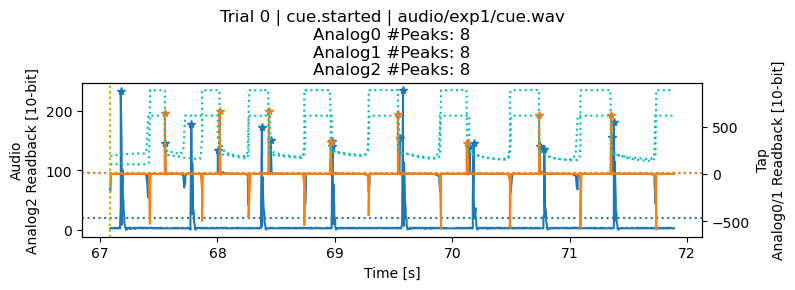

17955:20355
Analog0 Peaks [indices]: [  25  172  456  684  895 1029 1152 1415 1653 1803 2082 2226]
Analog1 Peaks [indices]: [  22  174  452  685  893 1025 1148 1419 1650 1800 2081 2223]
Analog2 Peaks [indices]: [  23  250  472  704  848  995 1220 1448 1671 1902 2048 2195]


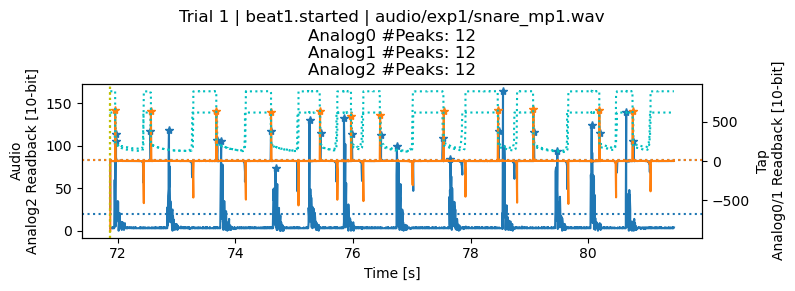

20459:21659
Analog0 Peaks [indices]: [ 170  316  457  600  761  914 1069]
Analog1 Peaks [indices]: [ 167  311  453  597  760  913 1064]
Analog2 Peaks [indices]: [  23  175  323  473  623  774  924 1075]


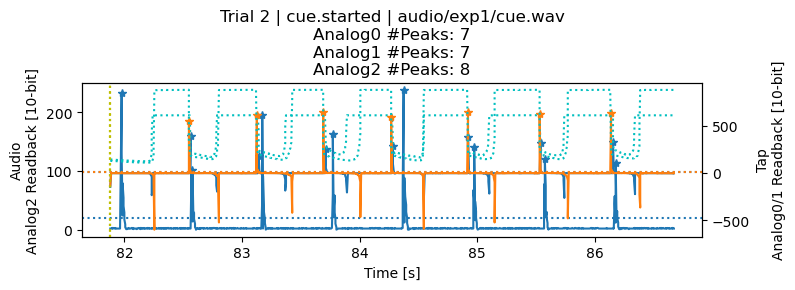

21655:24055
Analog0 Peaks [indices]: [  45  267  436  694  870 1023 1211 1428 1664 1831 2076 2168]
Analog1 Peaks [indices]: [  22  180  269  434  708  872 1024 1213 1427 1663 1832 2075 2170]
Analog2 Peaks [indices]: [  23  247  470  697  847  996 1226 1449 1673 1899 2047 2200]


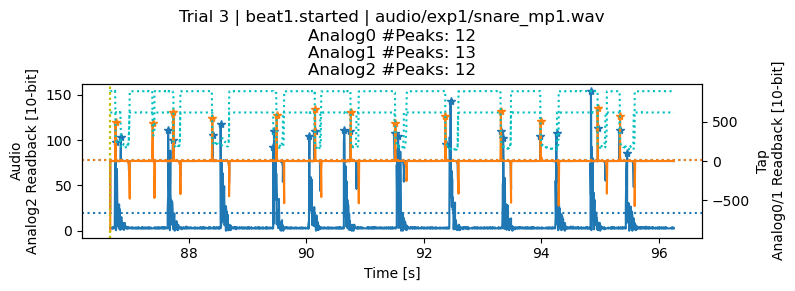

24159:25359
Analog0 Peaks [indices]: [  60  164  303  455  605  755  900 1059]
Analog1 Peaks [indices]: [  57  160  299  454  607  751  897 1057]
Analog2 Peaks [indices]: [  23  174  325  473  624  774  924 1074]


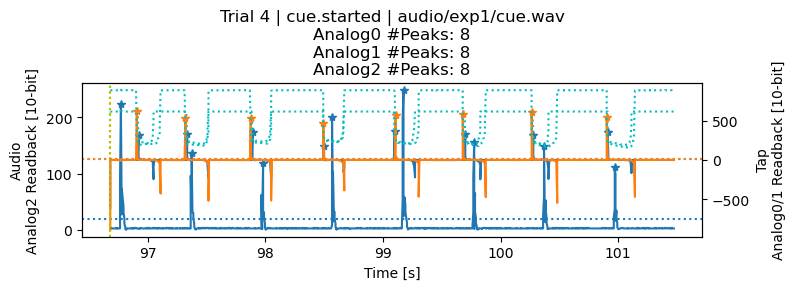

25355:27755
Analog0 Peaks [indices]: [  46  185  279  434  594  879 1033 1221 1448 1639 1868 2030 2183]
Analog1 Peaks [indices]: [  45  185  276  436  592  878 1033 1223 1445 1638 1869 2012 2178]
Analog2 Peaks [indices]: [  25  248  471  703  848  998 1224 1447 1680 1898 2052 2198]


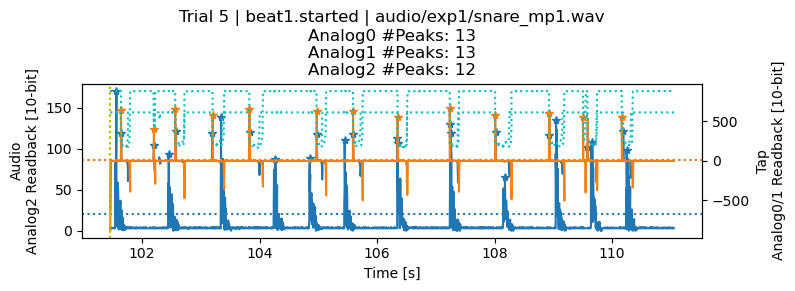

27860:29060
Analog0 Peaks [indices]: [ 129  290  448  591  740  898 1048]
Analog1 Peaks [indices]: [ 133  283  441  587  733  888 1045]
Analog2 Peaks [indices]: [  23  174  324  475  623  773  924 1074]


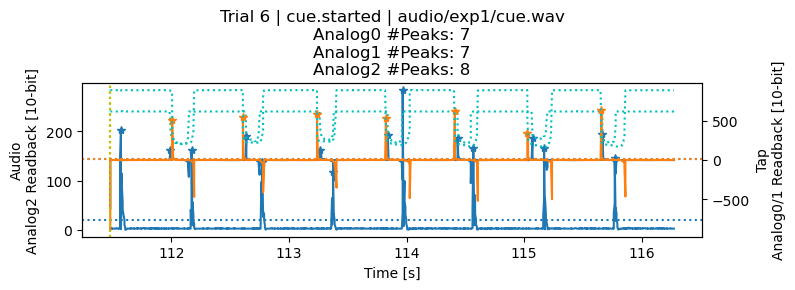

29055:31455
Analog0 Peaks [indices]: [  45  244  420  596  866 1006 1208 1421 1679 1843 2083 2193]
Analog1 Peaks [indices]: [  36  238  416  594  867 1007 1217 1419 1677 1833 2078 2188]
Analog2 Peaks [indices]: [  30  251  481  701  848 1002 1225 1454 1678 1899 2048 2208]


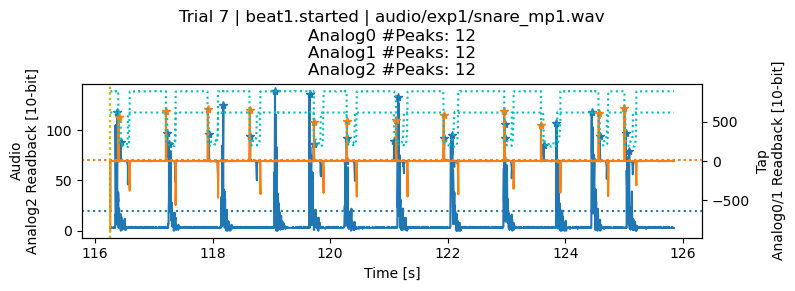

33559:34759
Analog0 Peaks [indices]: [ 153  294  438  597  745  901 1066]
Analog1 Peaks [indices]: [ 153  276  427  592  741  899 1058]
Analog2 Peaks [indices]: [  24  175  325  476  626  774  924 1075]


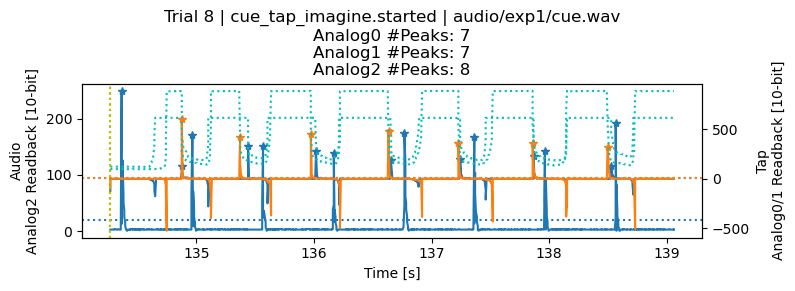

34759:37159
Analog0 Peaks [indices]: [   9 2044 2178 2326]
Analog1 Peaks [indices]: [   8 2040 2173 2317]
Analog2 Peaks [indices]: []


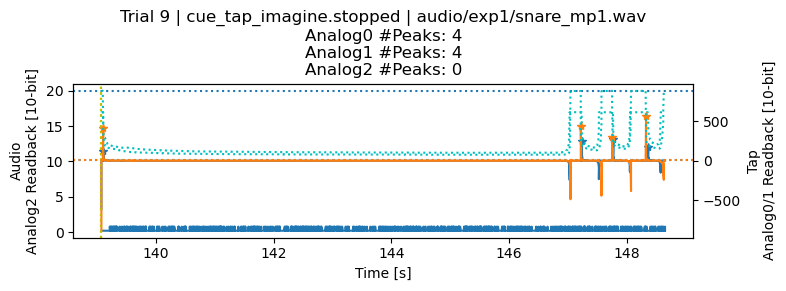

39264:40464
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [26]
Analog2 Peaks [indices]: [  25  175  326  476  627  777  925 1075]


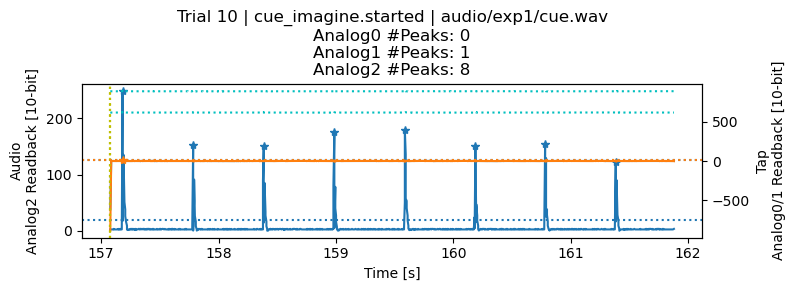

40464:42864
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


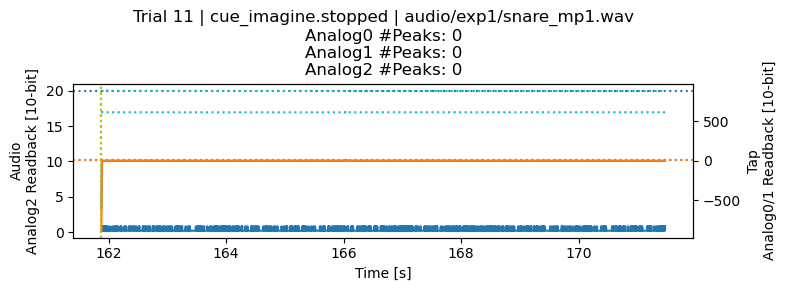

44963:46163
Analog0 Peaks [indices]: [ 170  311  464  610  761  904 1066]
Analog1 Peaks [indices]: [ 169  309  463  607  756  902 1067]
Analog2 Peaks [indices]: [  28  178  329  479  628  780  928 1078]


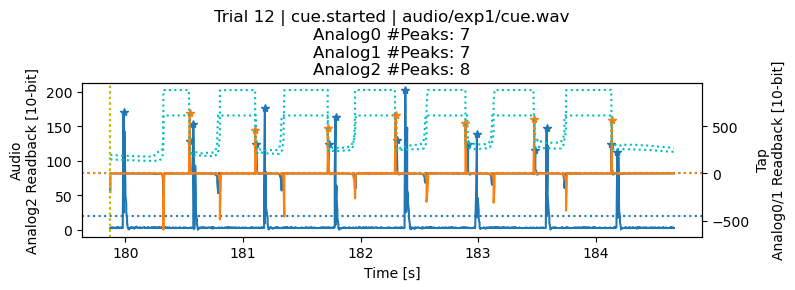

46159:48559
Analog0 Peaks [indices]: [ 160  297  459  603  766  916 1076 1295 1403 1527 1676 1821 1966 2114
 2264]
Analog1 Peaks [indices]: [ 159  295  455  600  763  914 1071 1289 1401 1528 1677 1829 1963 2117
 2265]
Analog2 Peaks [indices]: [  37  178  326  476  635  781  929 1081 1228 1379 1537 1678 1832 1980
 2127 2278]


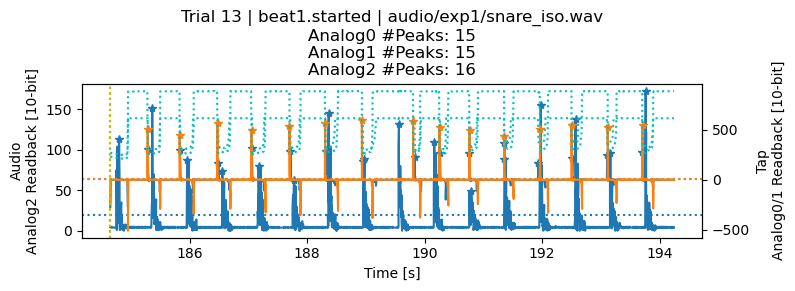

48663:49863
Analog0 Peaks [indices]: [ 309  467  608  770  916 1066]
Analog1 Peaks [indices]: [  29  302  464  608  764  916 1069]
Analog2 Peaks [indices]: [  28  180  328  478  630  779  929 1080]


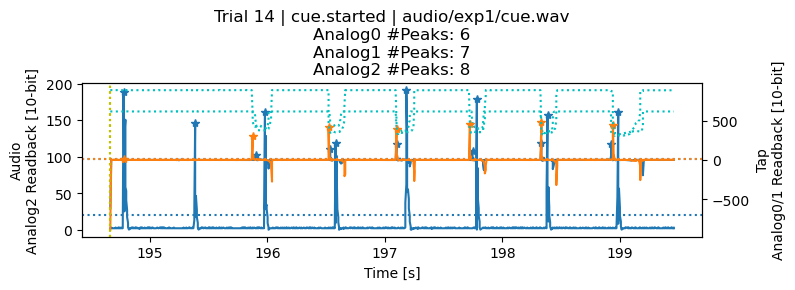

49859:52259
Analog0 Peaks [indices]: [  52  179  318  467  614  762  909 1067 1215 1379 1530 1679 1826 1975
 2128 2279]
Analog1 Peaks [indices]: [  53  174  316  467  613  758  906 1067 1210 1372 1525 1677 1828 1972
 2126 2278]
Analog2 Peaks [indices]: [  30  179  328  487  632  778  935 1083 1228 1384 1531 1682 1830 1984
 2129 2279]


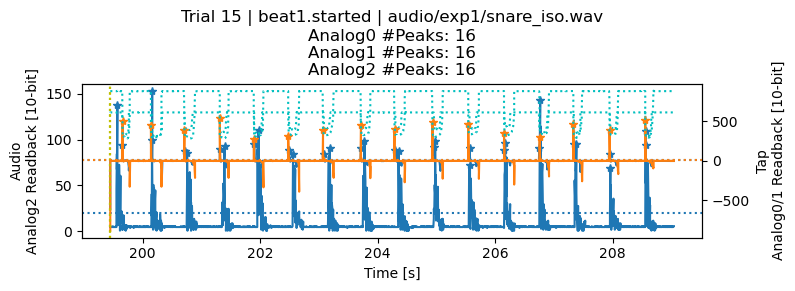

52363:53563
Analog0 Peaks [indices]: [  99  256  388  530  665  783  911 1076]
Analog1 Peaks [indices]: [  30  101  250  378  528  659  779  911 1073]
Analog2 Peaks [indices]: [  29  179  330  480  629  781  929 1079]


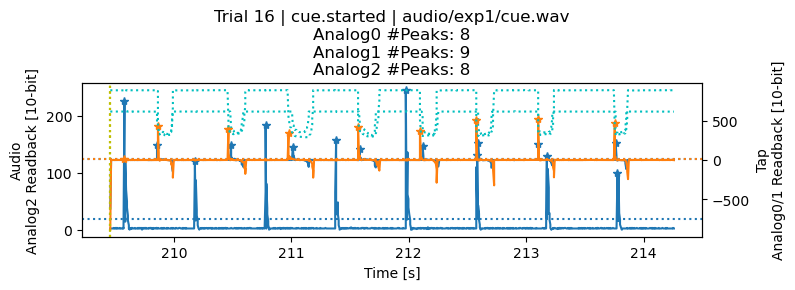

53563:55963
Analog0 Peaks [indices]: [  51  170  325  476  615  763  909 1071 1289 1412 1532 1683 1828 1971
 2116 2270]
Analog1 Peaks [indices]: [  52  168  321  469  614  756  910 1068 1287 1409 1528 1674 1825 1964
 2111 2267]
Analog2 Peaks [indices]: [  37  182  332  484  629  787  931 1084 1230 1383 1532 1680 1833 1983
 2130 2287]


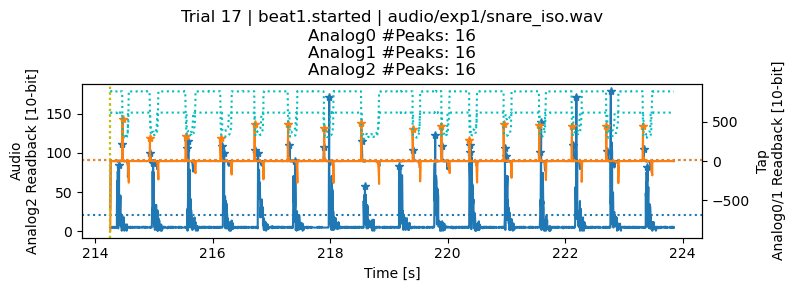

56063:57263
Analog0 Peaks [indices]: [ 122  285  447  597  751  919 1068]
Analog1 Peaks [indices]: [ 118  281  447  596  755  919 1067]
Analog2 Peaks [indices]: [  31  182  330  480  631  781  932 1082]


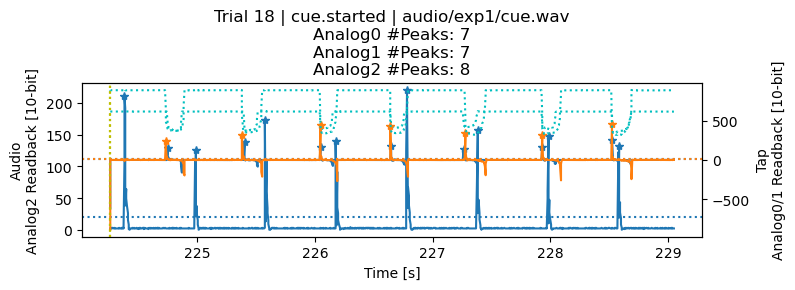

57259:59659
Analog0 Peaks [indices]: [  79  204  327  463  614  758  918 1074 1237 1381 1526 1675 1821 1963
 2119 2284]
Analog1 Peaks [indices]: [  79  198  325  461  612  754  921 1075 1241 1379 1523 1672 1824 1966
 2119 2287]
Analog2 Peaks [indices]: [  32  182  332  483  633  787  935 1082 1230 1385 1533 1680 1834 1989
 2130 2287]


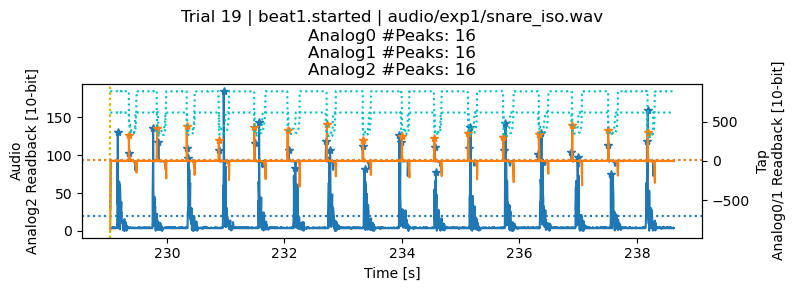

61768:62968
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  33  182  332  483  633  783  934 1082]


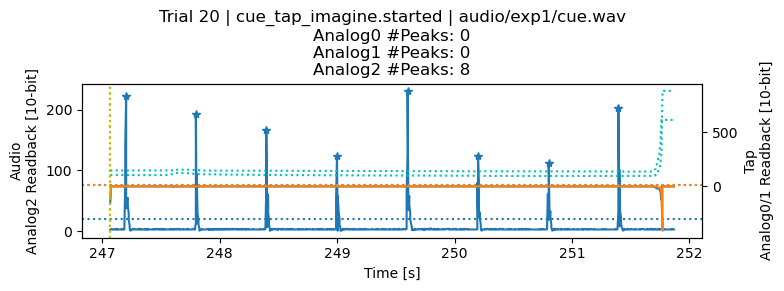

62968:65368
Analog0 Peaks [indices]: [  31  191  353  518  687  854 1024 1183 1338 1496 1660 1820]
Analog1 Peaks [indices]: [  35  183  351  516  686  849 1019 1173 1332 1489 1659 1817]
Analog2 Peaks [indices]: []


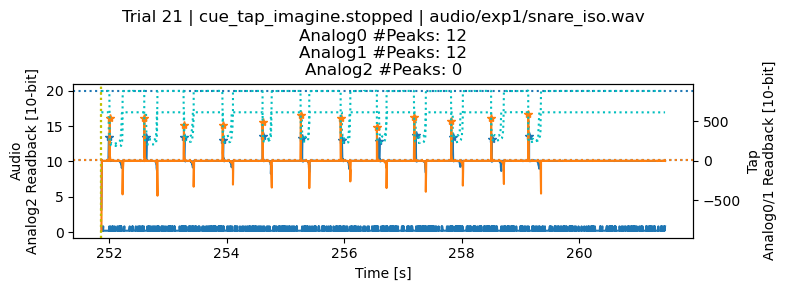

67467:68667
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [ 33 633 933]
Analog2 Peaks [indices]: [  32  182  333  483  632  782  932 1083]


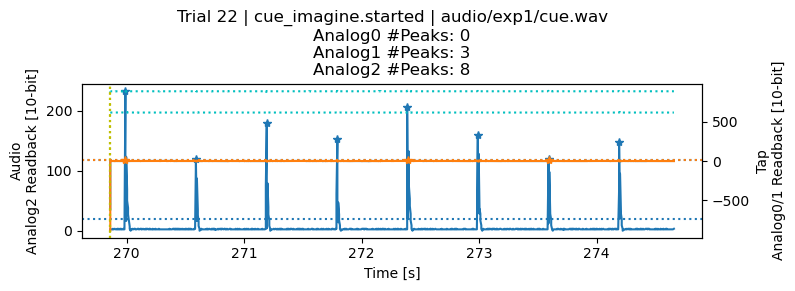

68667:71067
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


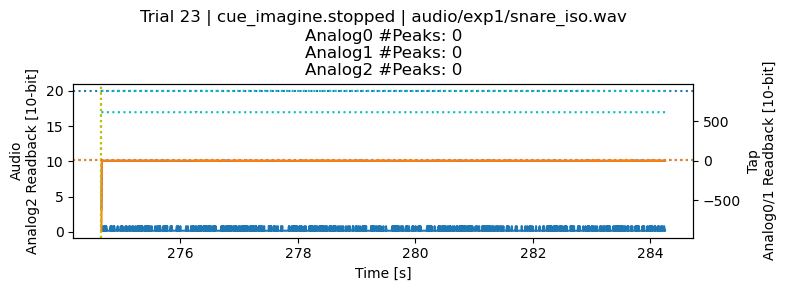

73164:74364
Analog0 Peaks [indices]: [188 329 465 614 755]
Analog1 Peaks [indices]: [186 324 469 609 747 814]
Analog2 Peaks [indices]: [  37  187  337  487  637  786  936 1087]


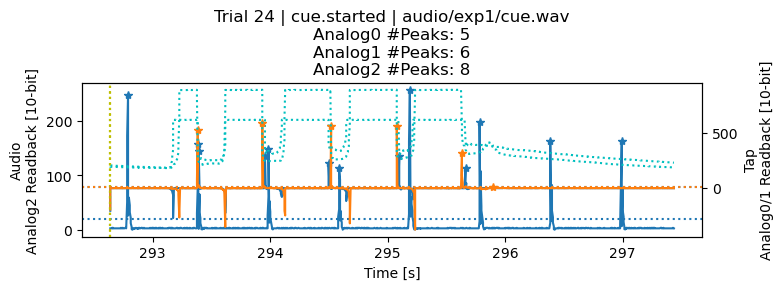

74360:76760
Analog0 Peaks [indices]: [ 146  252  397  591  697  934 1013 1196 1443 1793 1913 2168 2267]
Analog1 Peaks [indices]: [ 144  247  391  587  694  944 1197 1431 1791 1909 2164 2267]
Analog2 Peaks [indices]: [ 114  258  561  786  939 1311 1459 1762 1915 2138]


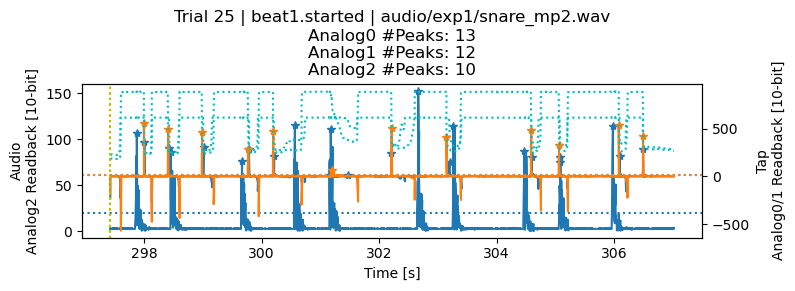

76866:78066
Analog0 Peaks [indices]: [174 376]
Analog1 Peaks [indices]: [172 322]
Analog2 Peaks [indices]: [  37  187  338  486  637  787  937 1088]


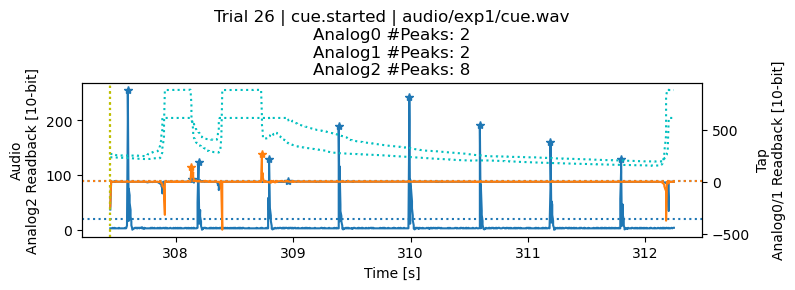

78062:80462
Analog0 Peaks [indices]: [  53  245  396  678  925 1061 1428 1773 1898 2187 2305]
Analog1 Peaks [indices]: [  51  227  388  675  921 1055 1423 1775 1897 2183 2300]
Analog2 Peaks [indices]: [ 113  260  561  790  937 1310 1464 1762 1913 2137]


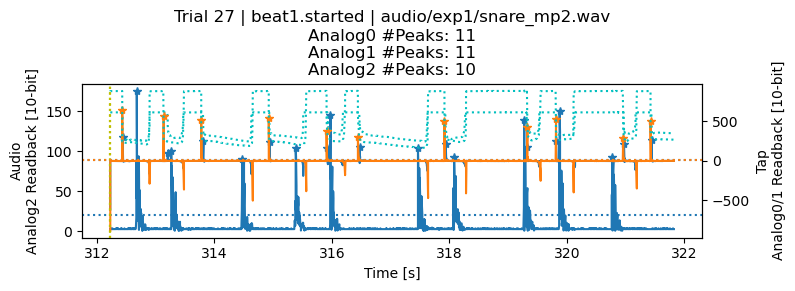

80567:81767
Analog0 Peaks [indices]: [652]
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  37  187  337  488  639  789  937 1087]


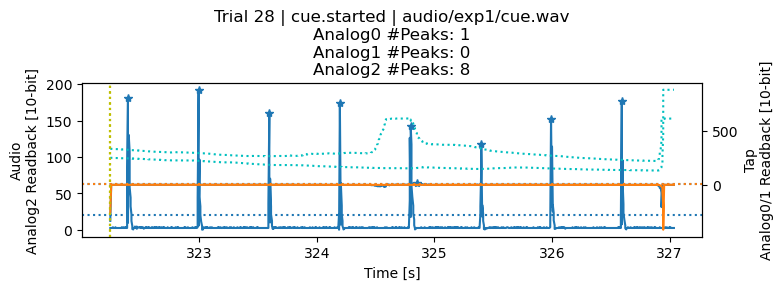

81763:84163
Analog0 Peaks [indices]: [  43  285  430  688  979 1264 1349 1507 1789 1914 2174 2313]
Analog1 Peaks [indices]: [  46  284  432  679  977 1218 1344 1503 1791 1917 2174 2305]
Analog2 Peaks [indices]: [ 112  264  565  791  943 1314 1462 1764 1913 2136]


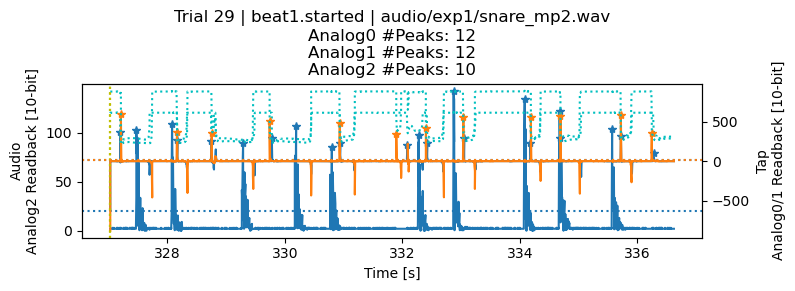

84267:85467
Analog0 Peaks [indices]: [80]
Analog1 Peaks [indices]: [  37  122  298  638 1121]
Analog2 Peaks [indices]: [  37  189  337  487  637  788  938 1089]


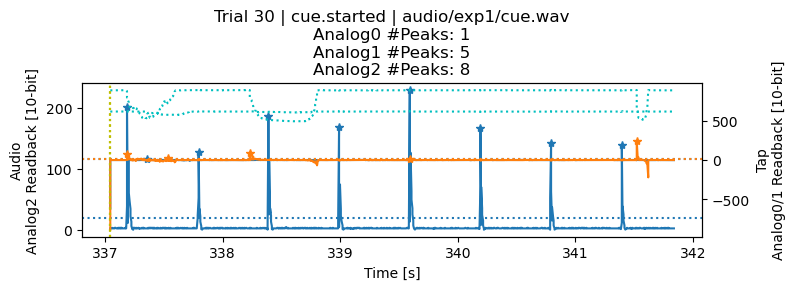

85466:87866
Analog0 Peaks [indices]: [ 148  291  488  699 1351 1489 1796 1911 2175 2300]
Analog1 Peaks [indices]: [ 150  286  494  701 1352 1488 1795 1912 2174 2323]
Analog2 Peaks [indices]: [ 115  266  568  787  949 1313 1467 1764 1913 2140]


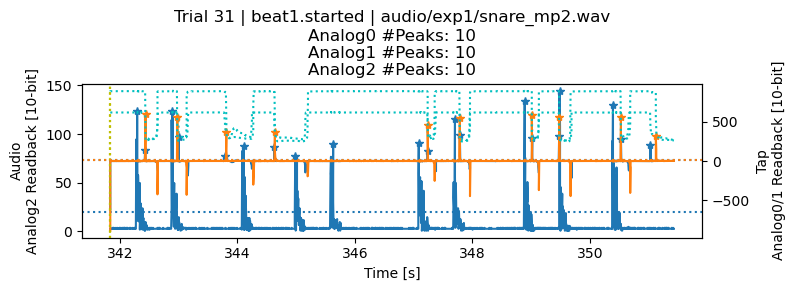

89966:91166
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  39  188  341  489  639  790  940 1090]


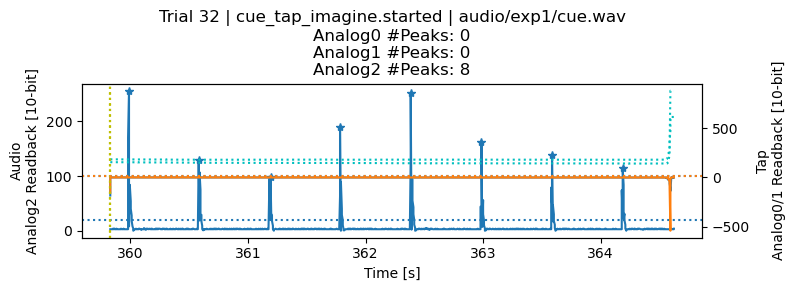

91166:93566
Analog0 Peaks [indices]: [  50  190  551  696 1016 1156 1478 1611 1770]
Analog1 Peaks [indices]: [  48  189  547  688 1004 1146 1481 1603 1767]
Analog2 Peaks [indices]: []


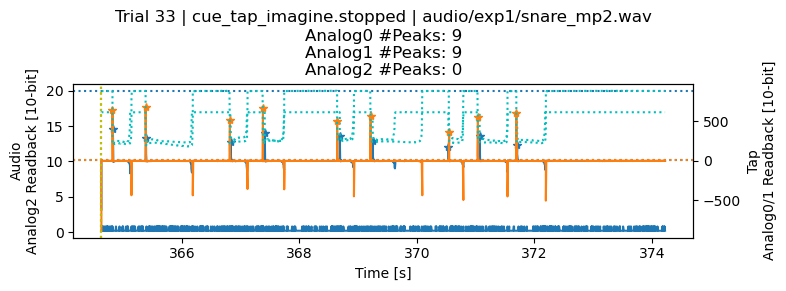

95666:96866
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  40  190  341  491  640  790  940 1091]


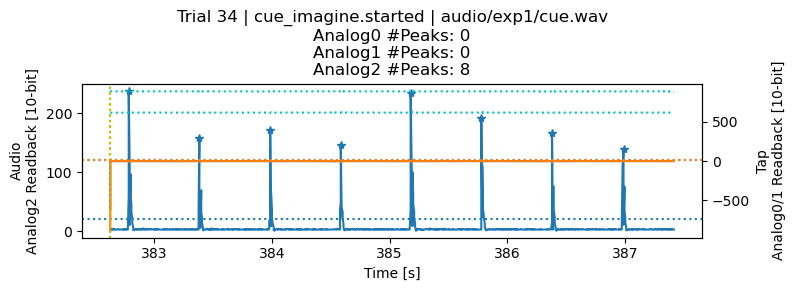

96866:99266
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


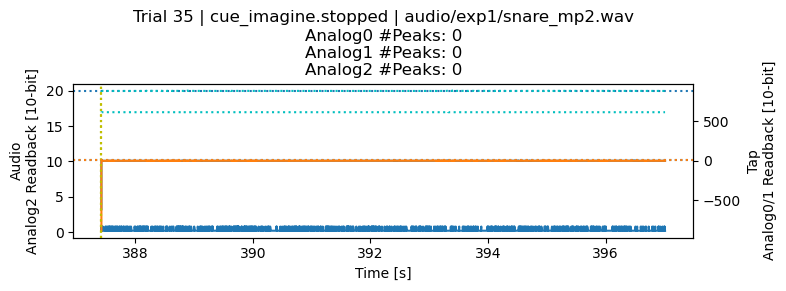

101370:102570
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  44  193  343  493  644  792  942 1093]


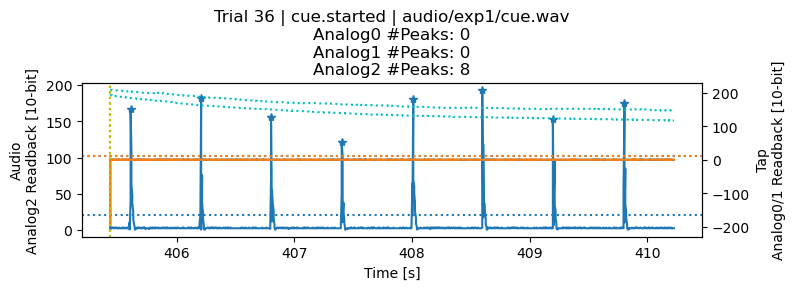

102566:104966
Analog0 Peaks [indices]: [ 212  371  527  655  905 1051 1244 1394 1687 1867 2058 2244]
Analog1 Peaks [indices]: [ 220  367  526  647  903 1050 1247 1392 1678 1858 2101 2238]
Analog2 Peaks [indices]: [  45  270  493  715  866 1021 1245 1467 1694 1916 2069 2219]


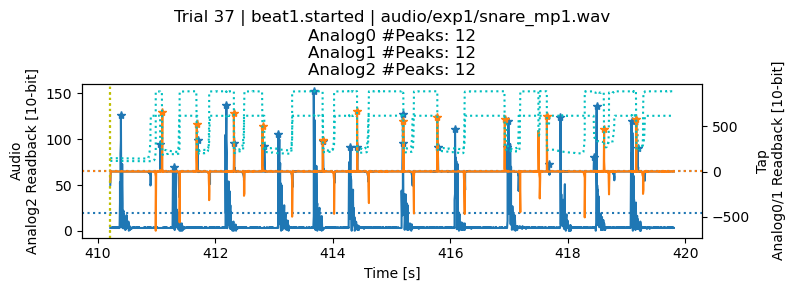

105070:106270
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [ 44 278 344 644]
Analog2 Peaks [indices]: [  43  195  343  493  643  794  944 1095]


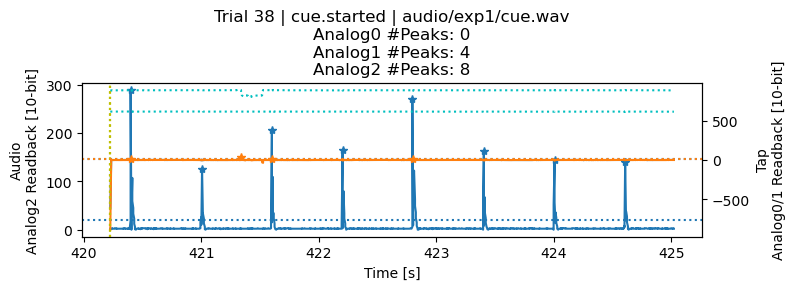

106266:108666
Analog0 Peaks [indices]: [  52  264  418  495  722  947 1049 1255 1431 1679 1937 2058 2260]
Analog1 Peaks [indices]: [  52  265  419  707  955 1046 1257 1427 1684 1944 2054 2257]
Analog2 Peaks [indices]: [  45  274  495  719  871 1020 1242 1468 1694 1921 2068 2219]


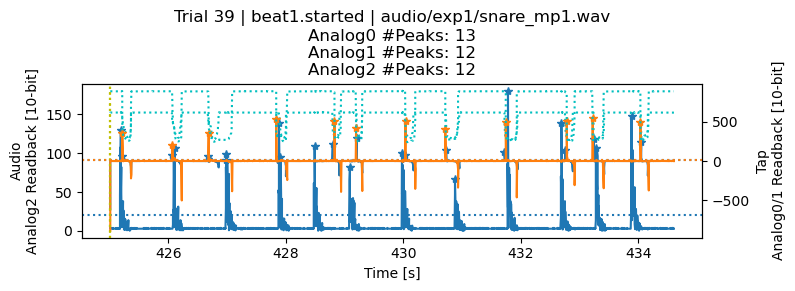

108770:109970
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [20]
Analog2 Peaks [indices]: [  45  195  345  496  645  794  944 1095]


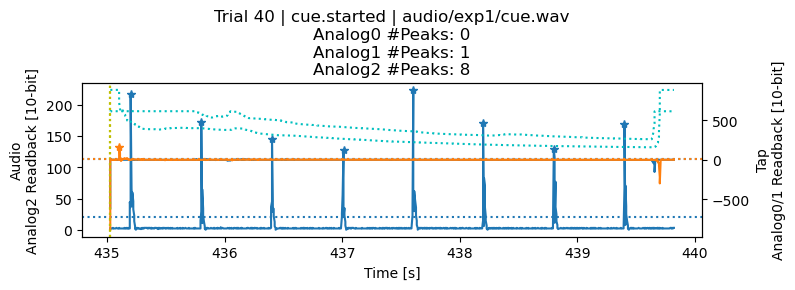

109965:112365
Analog0 Peaks [indices]: [  65  274  405  755  896 1005 1246 1446 1625 1807 2031 2191]
Analog1 Peaks [indices]: [  67  270  403  755  894 1004 1261 1448 1622 1802 2028 2189]
Analog2 Peaks [indices]: [  46  274  497  721  882 1022 1245 1473 1695 1924 2075 2223]


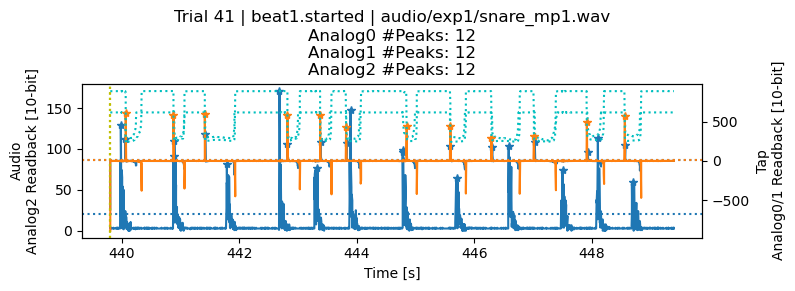

112471:113671
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [46]
Analog2 Peaks [indices]: [  45  196  346  496  645  795  945 1096]


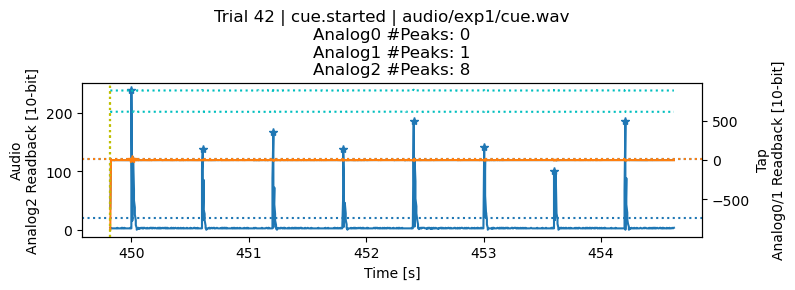

113670:116070
Analog0 Peaks [indices]: [  32  295  434  753  895  993 1149 1458 1664 1925 2104 2207 2341]
Analog1 Peaks [indices]: [  29  288  431  752  895  988 1143 1459 1662 1916 2097 2204 2334]
Analog2 Peaks [indices]: [  52  270  497  722  877 1019 1251 1476 1699 1919 2069 2223]


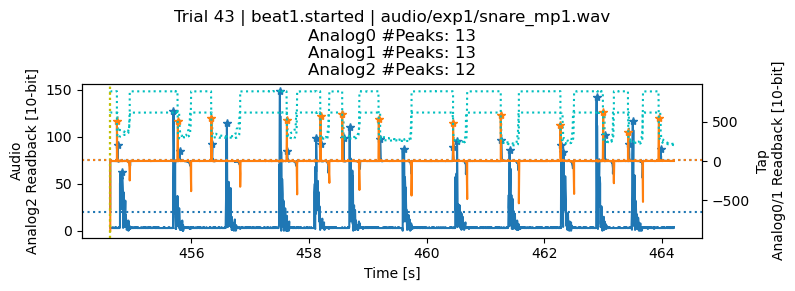

118169:119369
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  49  197  347  498  649  798  949 1097]


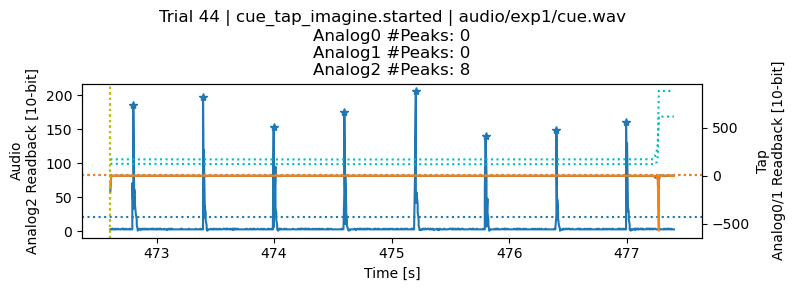

119371:121771
Analog0 Peaks [indices]: [  47  272  426  669  789  922 1140 1348 1588 1729 1850]
Analog1 Peaks [indices]: [  51  272  434  667  788  921 1144 1351 1596 1718 1850]
Analog2 Peaks [indices]: []


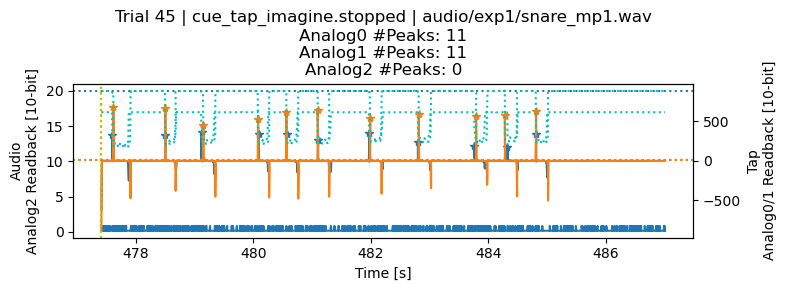

123874:125074
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  48  197  348  498  648  799  947 1097]


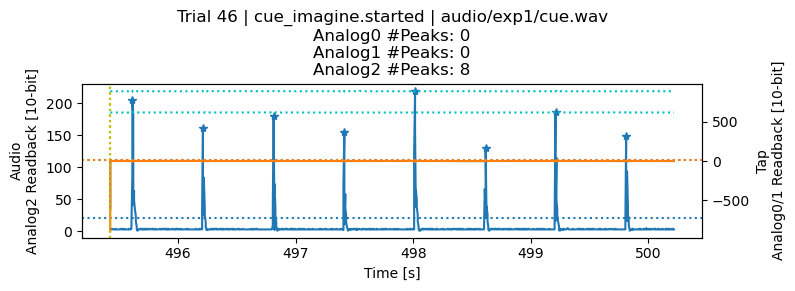

125075:127475
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


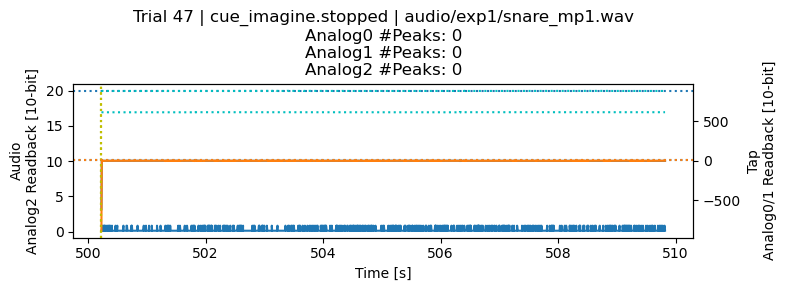

129573:130773
Analog0 Peaks [indices]: [510 574]
Analog1 Peaks [indices]: [521]
Analog2 Peaks [indices]: [  51  202  352  503  651  801  952 1102]


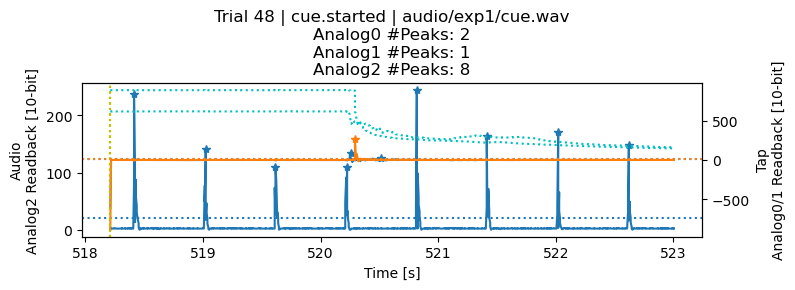

130769:133169
Analog0 Peaks [indices]: [ 217  327  586  748  992 1278 1466 1738 1900 2067 2255]
Analog1 Peaks [indices]: [ 208  324  588  750  996 1296 1466 1737 1900 2075 2238]
Analog2 Peaks [indices]: [ 125  280  576  805  951 1330 1484 1775 1925 2159]


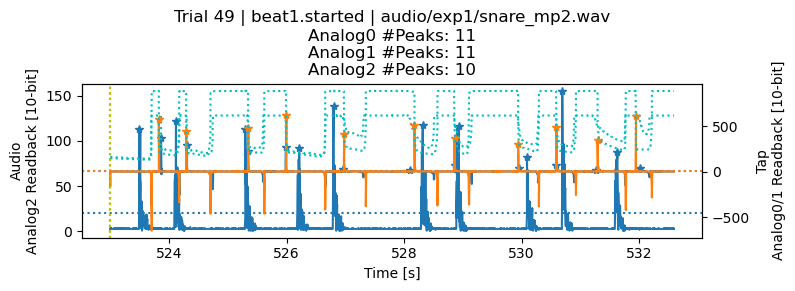

133273:134473
Analog0 Peaks [indices]: [15]
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  52  202  352  503  652  801  952 1102]


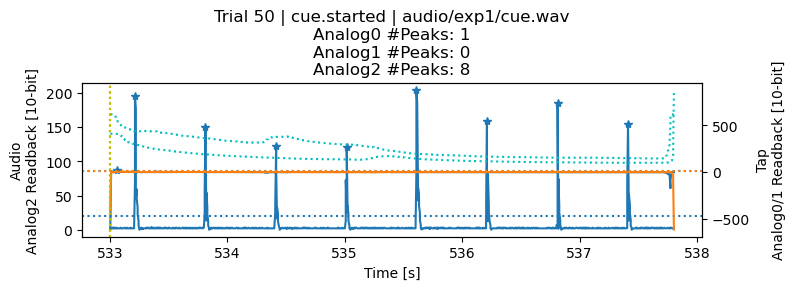

134470:136870
Analog0 Peaks [indices]: [  71  312  596  832  978 1207 1455 1743 1892 2259]
Analog1 Peaks [indices]: [  72  309  545  831  977 1205 1453 1757 1890 2249]
Analog2 Peaks [indices]: [ 128  279  579  801  952 1326 1477 1776 1927 2155]


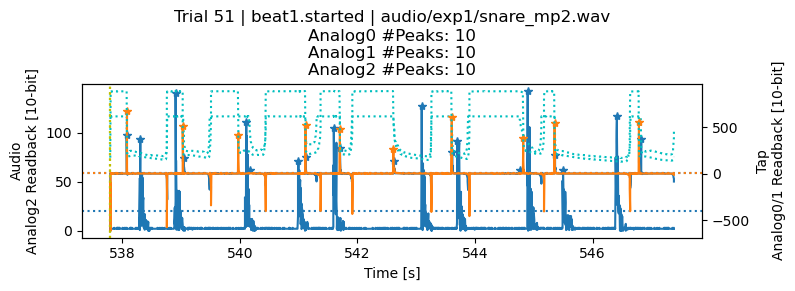

136977:138177
Analog0 Peaks [indices]: [271]
Analog1 Peaks [indices]: [233]
Analog2 Peaks [indices]: [  54  203  353  504  654  802  953 1103]


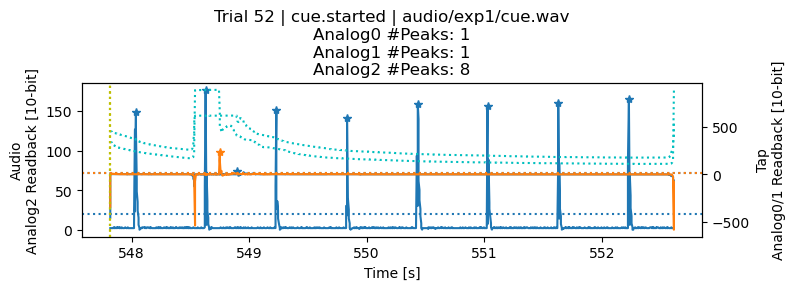

138173:140573
Analog0 Peaks [indices]: [  70  313  578  714  989 1239 1466 1797 1920 2172]
Analog1 Peaks [indices]: [  72  312  566  713  987 1238 1463 1778 1914 2163]
Analog2 Peaks [indices]: [ 127  277  578  805  960 1331 1478 1778 1927 2155]


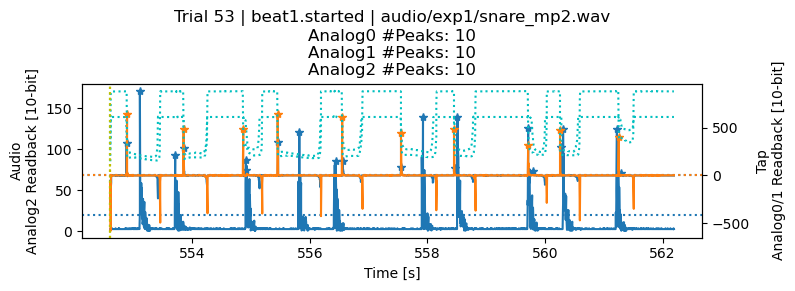

140677:141877
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  54  203  354  504  654  805  953 1103]


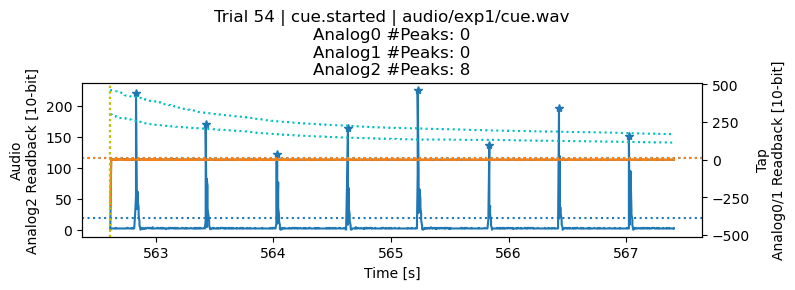

141873:144273
Analog0 Peaks [indices]: [ 158  315  608  833  947 1361 1485 1813 1915 2056 2374]
Analog1 Peaks [indices]: [ 108  161  316  610  833  960 1360 1491 1811 1913 2051 2371]
Analog2 Peaks [indices]: [ 133  283  582  803  954 1329 1481 1782 1930 2155]


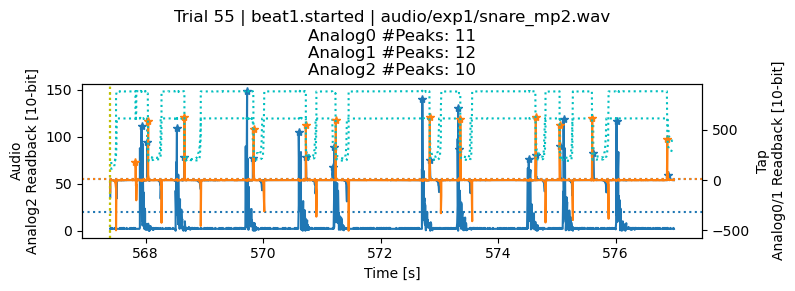

146381:147581
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  55  204  354  505  655  805  956 1104]


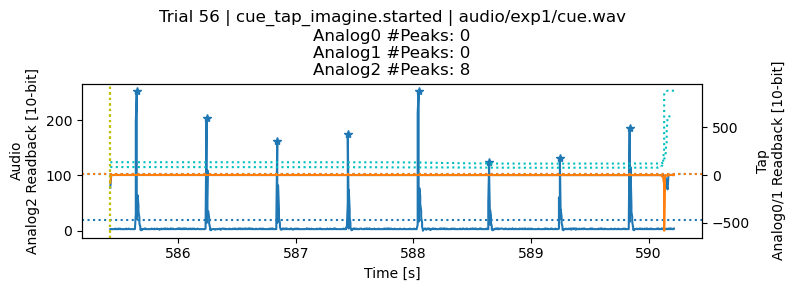

147582:149982
Analog0 Peaks [indices]: [  56  296  617  880 1012 1318 1471 1823 1976 2031 2293]
Analog1 Peaks [indices]: [  54  297  620  877 1011 1319 1465 1820 1974 2292]
Analog2 Peaks [indices]: []


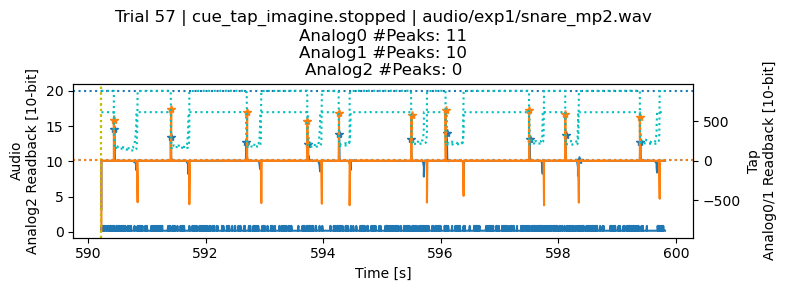

152083:153283
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [ 656 1106]
Analog2 Peaks [indices]: [  57  205  355  506  655  807  955 1105]


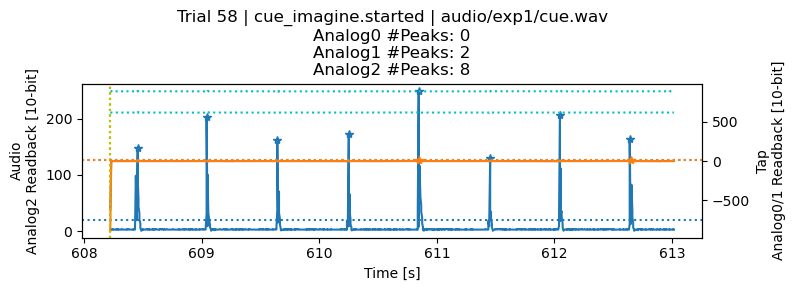

153283:155683
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


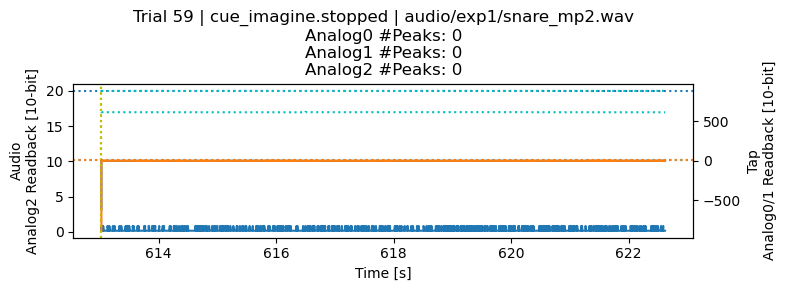

157781:158981
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  57  207  357  508  657  808  959 1109]


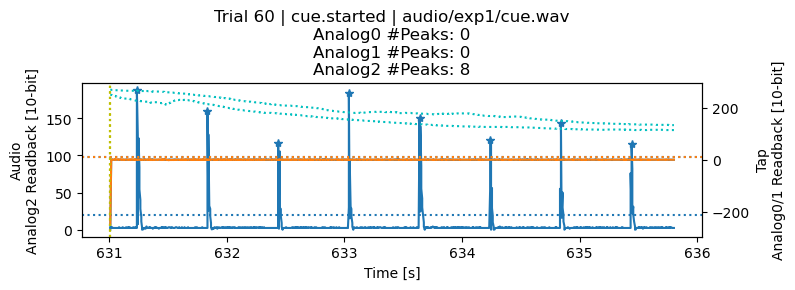

158977:161377
Analog0 Peaks [indices]: [  81  137  263  412  519  648  789  947 1091 1251 1400 1546 1704 1859
 2002 2159 2300]
Analog1 Peaks [indices]: [ 137  264  414  514  649  788  946 1093 1253 1398 1541 1703 1854 1995
 2153 2297]
Analog2 Peaks [indices]: [  61  214  365  507  660  812  958 1109 1257 1414 1562 1717 1863 2007
 2161 2315]


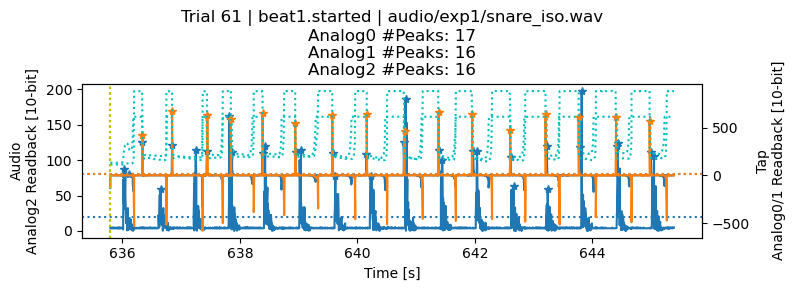

161481:162681
Analog0 Peaks [indices]: [588]
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  60  210  358  508  660  809  959 1110]


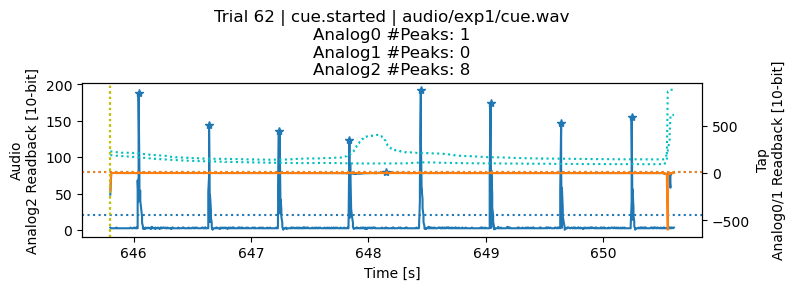

162678:165078
Analog0 Peaks [indices]: [  66  192  336  491  637  790  935 1087 1245 1394 1539 1693 1854 1996
 2151 2298]
Analog1 Peaks [indices]: [  67  191  329  489  634  787  939 1087 1242 1386 1537 1685 1848 1990
 2147 2291]
Analog2 Peaks [indices]: [  63  208  358  518  660  816  962 1111 1263 1413 1560 1713 1869 2011
 2160 2311]


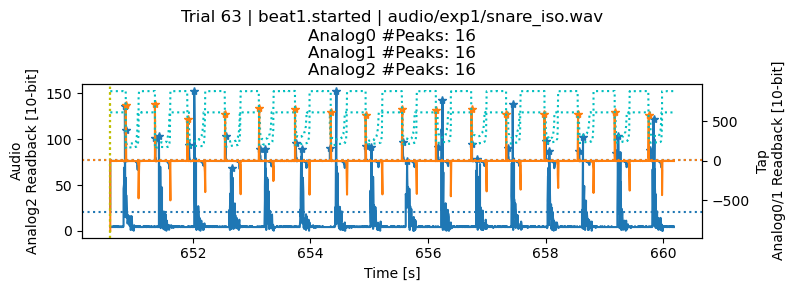

165181:166381
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [61]
Analog2 Peaks [indices]: [  60  210  360  511  660  809  959 1110]


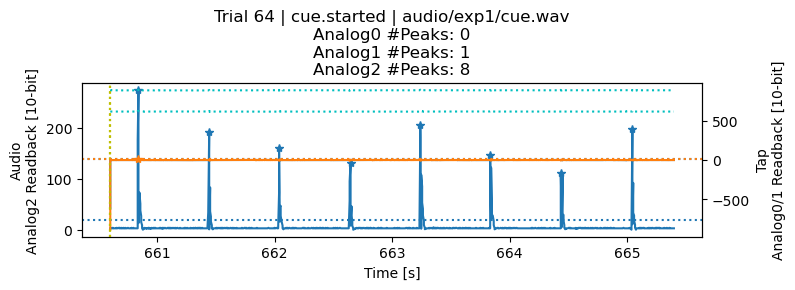

166377:168777
Analog0 Peaks [indices]: [  82  202  337  488  638  790  943 1088 1245 1393 1541 1697 1851 1995
 2145 2294]
Analog1 Peaks [indices]: [  77  205  339  485  639  786  938 1082 1240 1388 1538 1693 1845 1992
 2138 2289]
Analog2 Peaks [indices]: [  60  208  362  510  660  812  962 1115 1259 1412 1567 1710 1860 2012
 2158 2313]


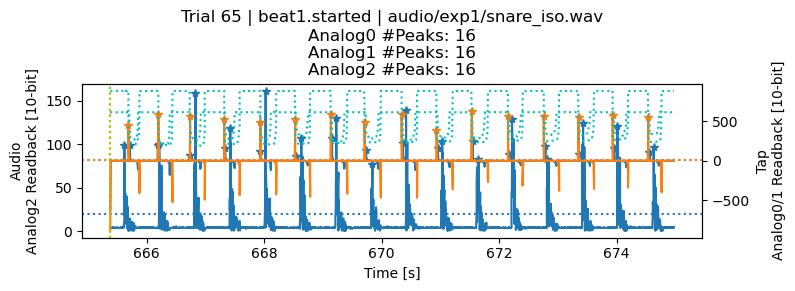

168882:170082
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  62  212  363  511  662  812  962 1113]


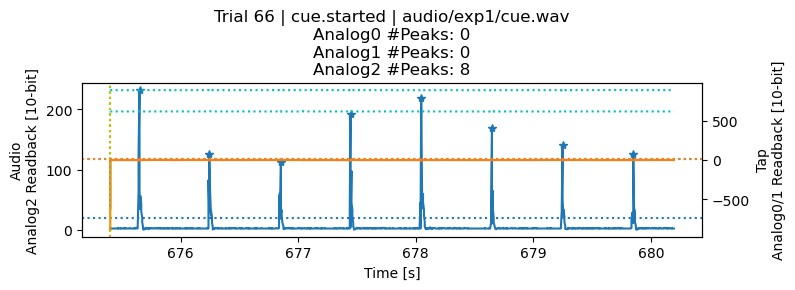

170081:172481
Analog0 Peaks [indices]: [  52  198  342  498  644  804  951 1101 1264 1407 1557 1709 1862 2004
 2146 2298]
Analog1 Peaks [indices]: [  56  190  341  493  644  800  953 1102 1267 1401 1552 1705 1858 2001
 2141 2298]
Analog2 Peaks [indices]: [  66  211  362  516  660  814  960 1109 1268 1410 1565 1713 1863 2015
 2164 2313]


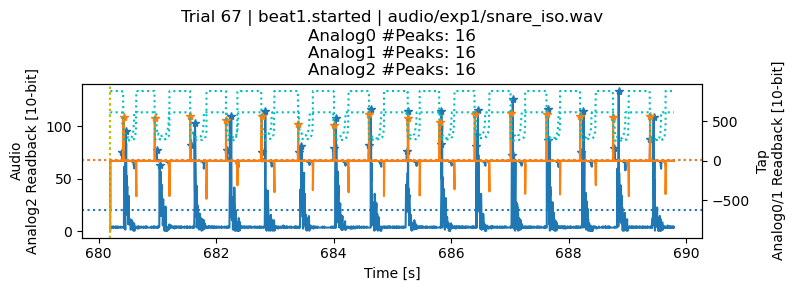

174586:175786
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  62  211  361  512  662  813  961 1111]


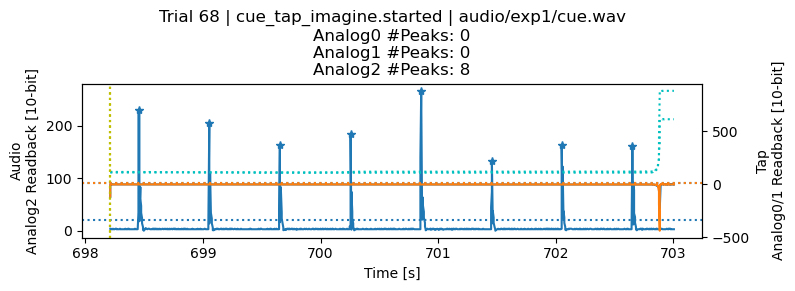

175786:178186
Analog0 Peaks [indices]: [  52  197  348  504  658  805  952 1096 1248 1393 1547 1702 1849 1995
 2145 2297]
Analog1 Peaks [indices]: [  51  197  353  506  657  802  951 1095 1246 1391 1548 1697 1847 1994
 2143 2297]
Analog2 Peaks [indices]: []


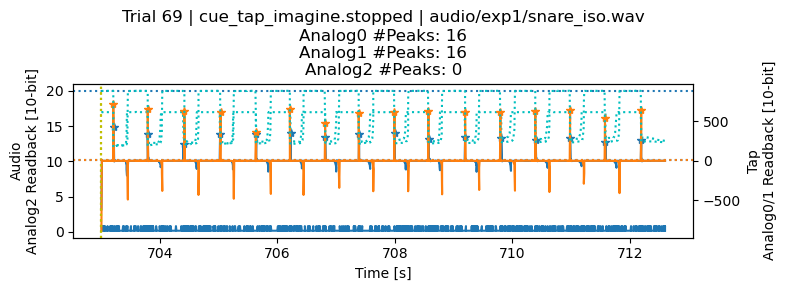

180280:181480
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [64]
Analog2 Peaks [indices]: [  66  215  365  516  666  814  965 1115]


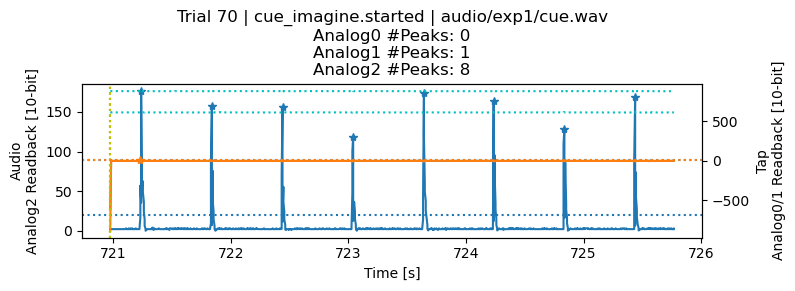

181480:183880
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


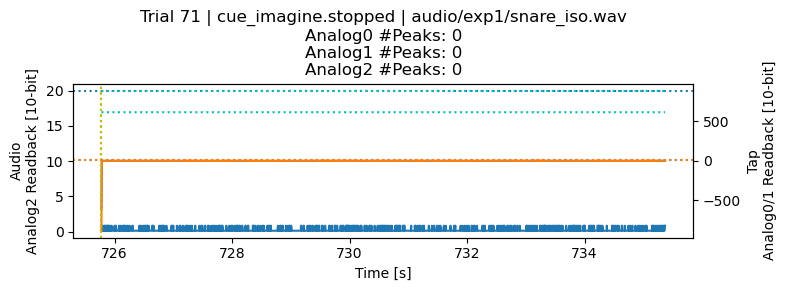

185981:187181
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  67  217  367  518  667  816  967 1117]


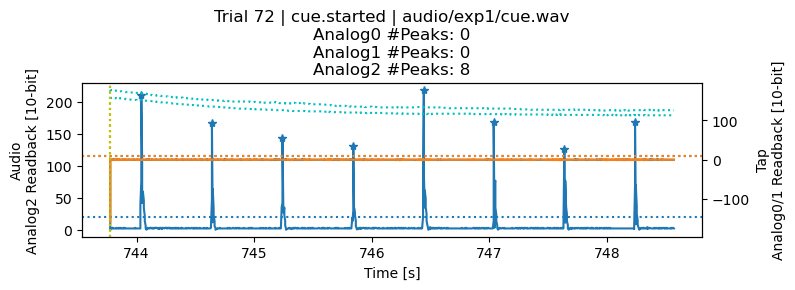

187182:189582
Analog0 Peaks [indices]: [ 193  343  495  648  795  939 1090 1251 1400 1553 1704 1858 2006 2148
 2298]
Analog1 Peaks [indices]: [ 187  343  495  638  788  939 1084 1247 1393 1552 1702 1850 1999 2144
 2295]
Analog2 Peaks [indices]: [  64  219  371  523  667  822  966 1115 1270 1416 1565 1718 1866 2024
 2165 2321]


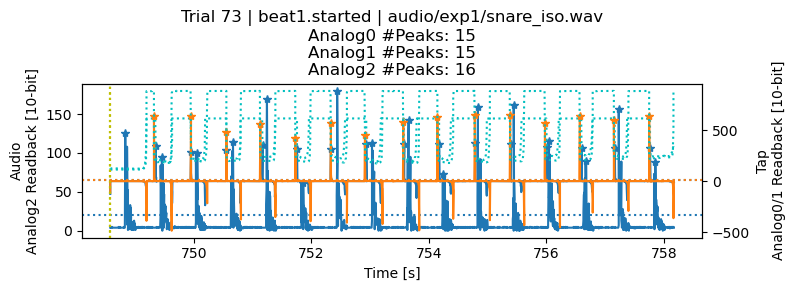

189680:190880
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  67  217  368  518  667  817  967 1117]


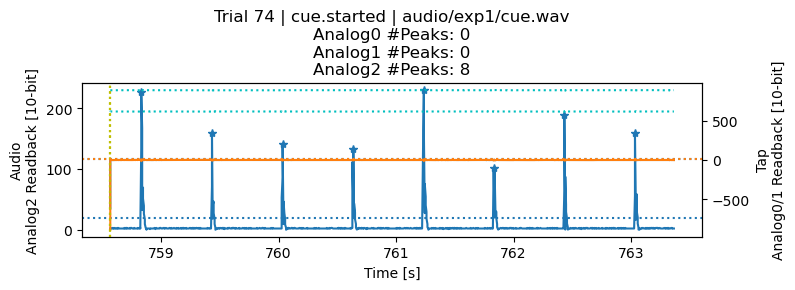

190876:193276
Analog0 Peaks [indices]: [  57  209  355  506  656  798  944 1100 1241 1386 1536 1683 1842 1996
 2149 2297]
Analog1 Peaks [indices]: [  64  207  350  500  655  794  946 1095 1234 1384 1533 1676 1835 1986
 2149 2293]
Analog2 Peaks [indices]: [  67  220  367  523  666  815  967 1116 1270 1418 1567 1721 1867 2016
 2168 2318]


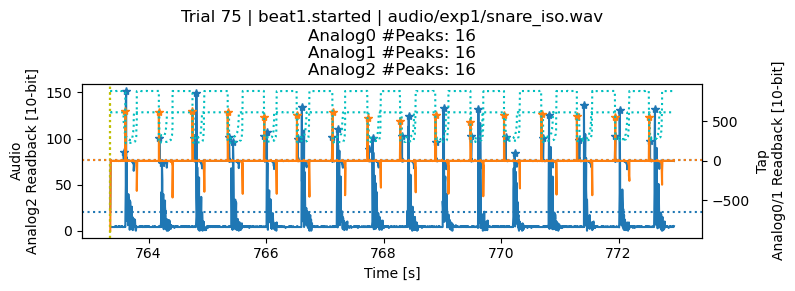

193384:194584
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [ 68 668]
Analog2 Peaks [indices]: [  67  218  369  519  670  820  968 1118]


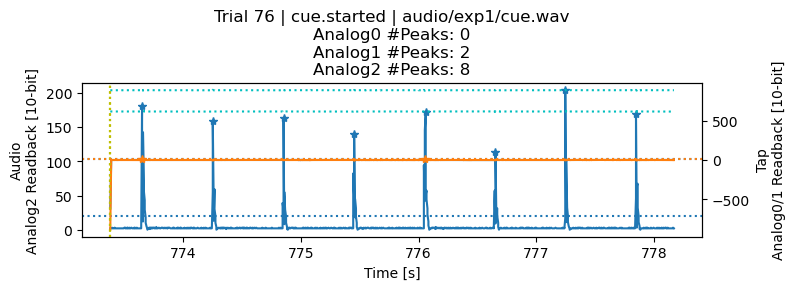

194580:196980
Analog0 Peaks [indices]: [  70  219  367  500  656  807  955 1097 1253 1407 1558 1708 1861 2009
 2161 2313]
Analog1 Peaks [indices]: [  75  210  361  502  657  801  944 1098 1247 1393 1556 1704 1859 2006
 2157 2318]
Analog2 Peaks [indices]: [  73  220  370  519  669  820  971 1125 1273 1417 1569 1721 1871 2020
 2171 2324]


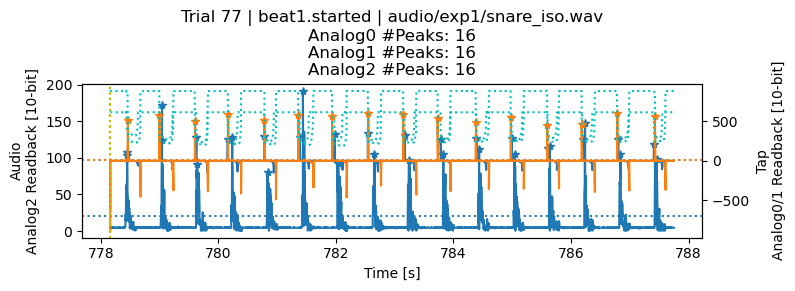

197088:198288
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  69  219  370  520  669  819  969 1119]


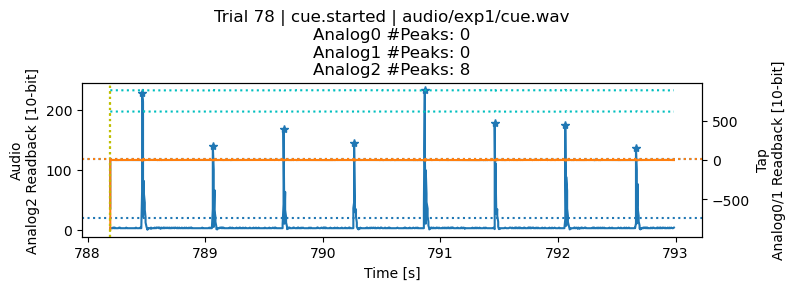

198284:200684
Analog0 Peaks [indices]: [  52  204  363  510  654  806  961 1109 1263 1407 1564 1714 1867 2012
 2152 2318]
Analog1 Peaks [indices]: [  49  205  363  507  655  802  955 1109 1256 1407 1559 1713 1864 2005
 2153 2323]
Analog2 Peaks [indices]: [  70  220  375  520  673  818  970 1120 1268 1422 1574 1730 1874 2025
 2170 2321]


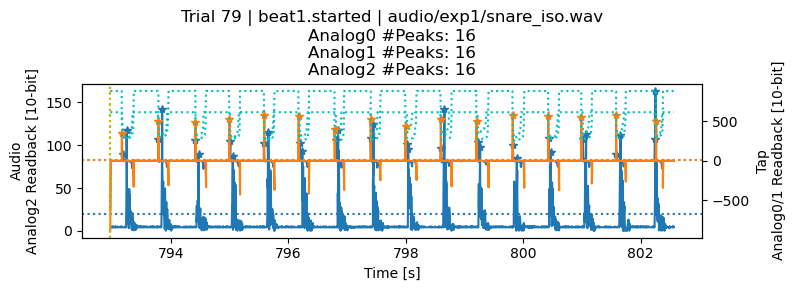

202788:203988
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  70  221  372  520  670  821  971 1121]


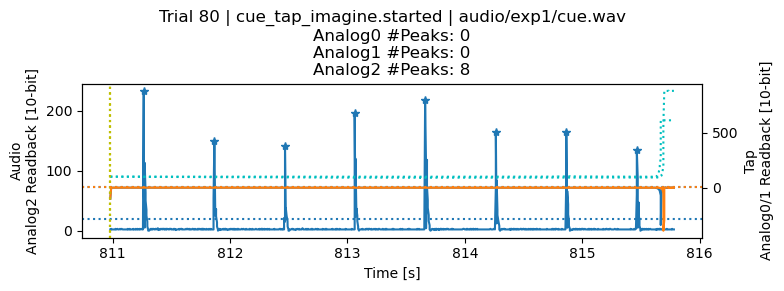

203988:206388
Analog0 Peaks [indices]: [  61  212  364  521  675  818  966 1119 1274 1419 1577 1730 1882 2032
 2196 2348]
Analog1 Peaks [indices]: [  61  208  364  519  673  814  965 1119 1265 1417 1575 1725 1876 2027
 2191 2341]
Analog2 Peaks [indices]: []


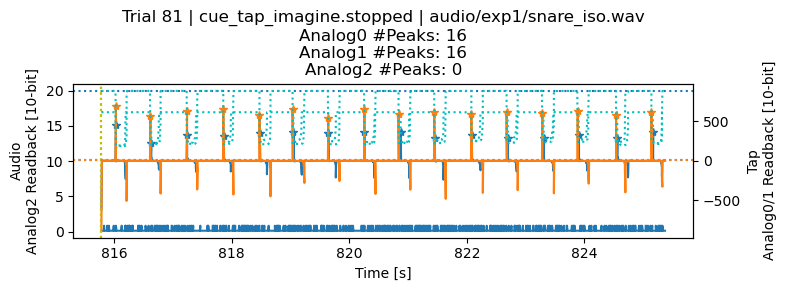

208488:209688
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [672]
Analog2 Peaks [indices]: [  71  222  372  523  671  821  971 1122]


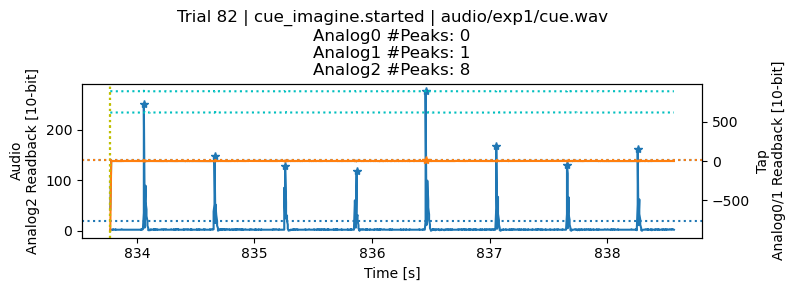

209688:212088
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


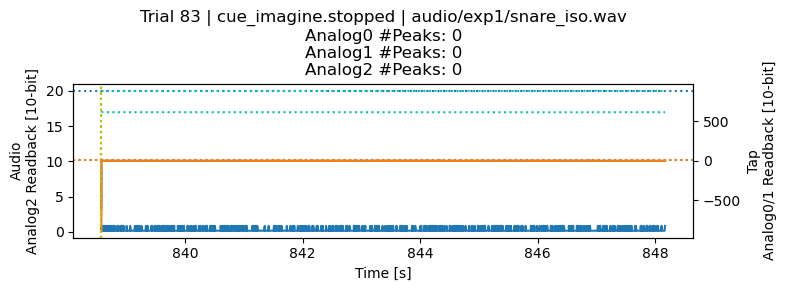

214193:215393
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [675]
Analog2 Peaks [indices]: [  74  224  374  525  674  823  974 1124]


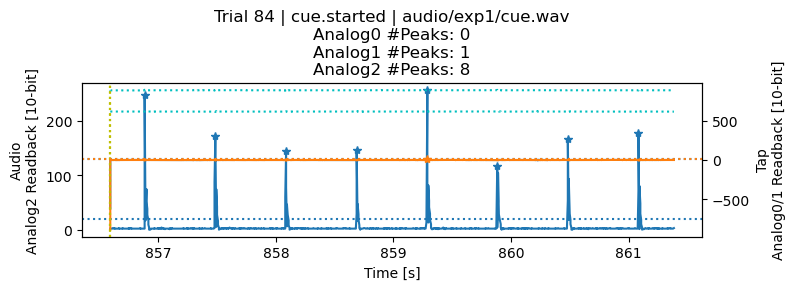

215388:217788
Analog0 Peaks [indices]: [ 240  401  628  729 1365 1482 1830 1934 2209]
Analog1 Peaks [indices]: [ 240  404  627  724  825 1337 1477 1832 1927 2207]
Analog2 Peaks [indices]: [ 148  298  606  823  975 1347 1503 1799 1955 2172]


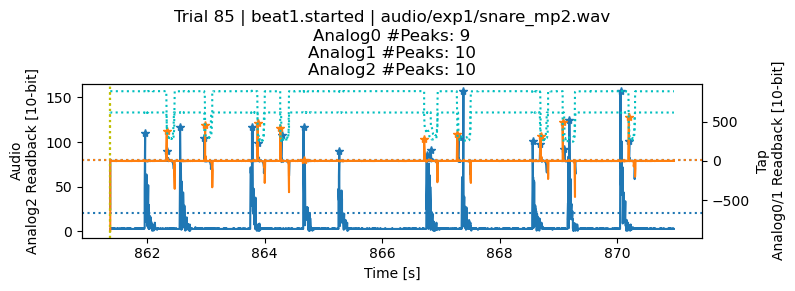

217892:219092
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  76  224  374  525  676  826  974 1124]


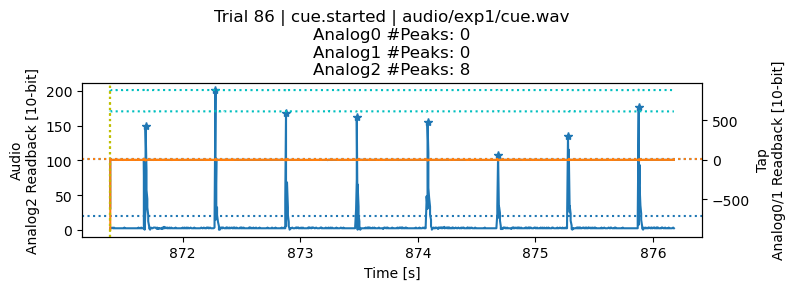

219089:221489
Analog0 Peaks [indices]: [  81  282  474  742  907  976 1178 1443 1803 1923 2205]
Analog1 Peaks [indices]: [  83  290  473  741  897 1173 1437 1797 1918 2205]
Analog2 Peaks [indices]: [ 148  304  598  827  977 1349 1503 1802 1951 2175]


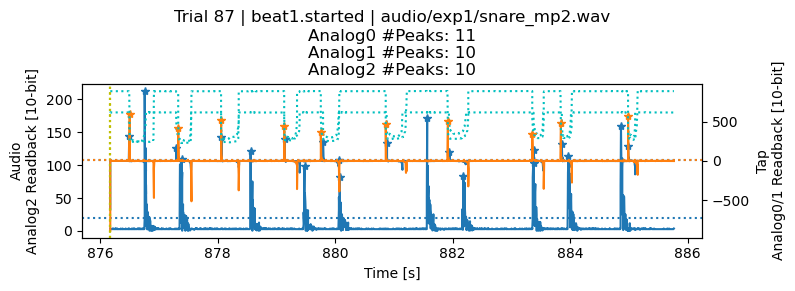

221596:222796
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  75  225  376  526  675  824  975 1125]


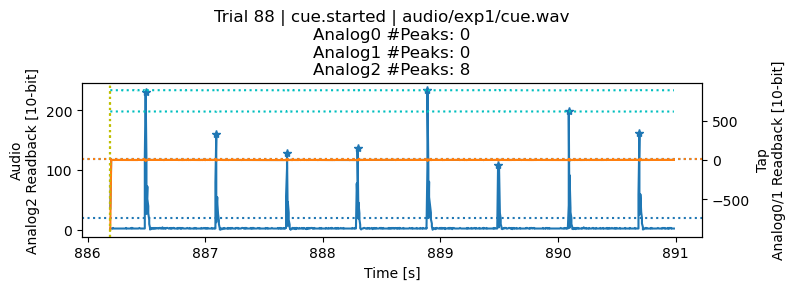

222792:225192
Analog0 Peaks [indices]: [ 106  320  560  719  929 1275 1476 1777 1922 2206]
Analog1 Peaks [indices]: [ 105  321  555  713  939 1254 1453 1752 1914 2208]
Analog2 Peaks [indices]: [ 150  301  604  828  978 1357 1500 1801 1950 2178]


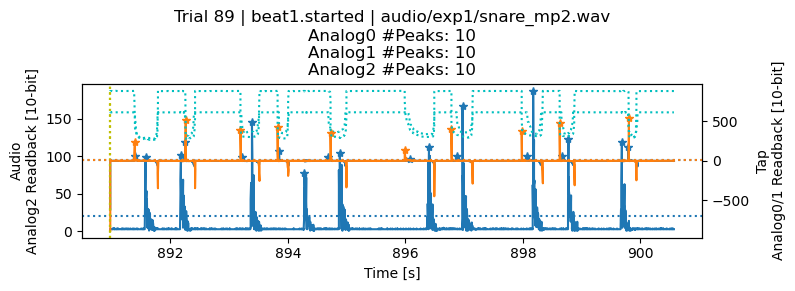

225300:226500
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  78  227  378  526  678  827  977 1127]


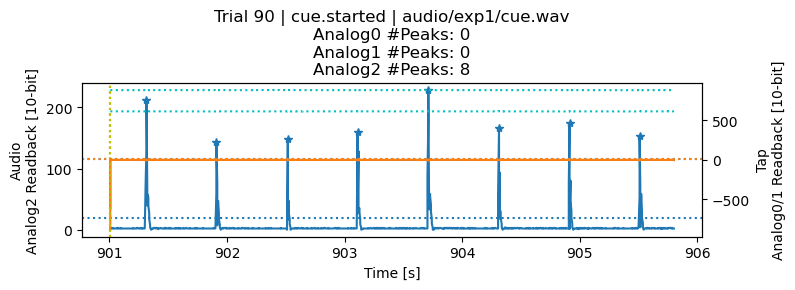

226497:228897
Analog0 Peaks [indices]: [  44  182  308  628  727  980 1396 1511 1808 1932 2211 2319]
Analog1 Peaks [indices]: [  13  185  309  630  727  984 1400 1514 1809 1932 2211 2317]
Analog2 Peaks [indices]: [ 154  310  602  827  975 1355 1502 1813 1951 2180]


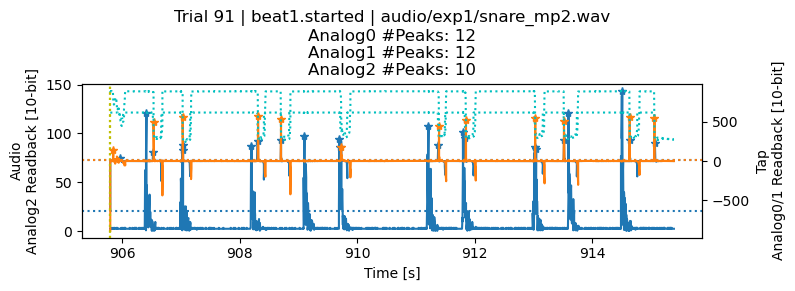

231000:232200
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  77  227  378  528  677  829  977 1127]


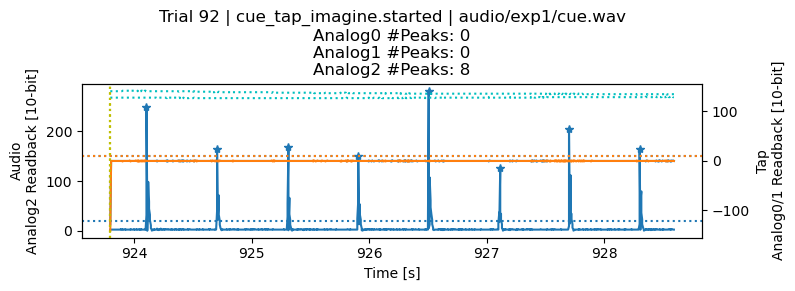

232200:234600
Analog0 Peaks [indices]: [ 101  240  444  738  894 1169 1314 1580 1724 2040]
Analog1 Peaks [indices]: [ 100  238  446  742  891 1168 1314 1578 1723 2041]
Analog2 Peaks [indices]: []


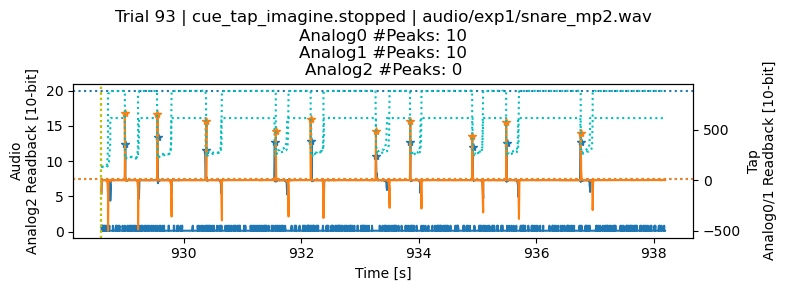

236700:237900
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  79  229  379  530  681  830  981 1129]


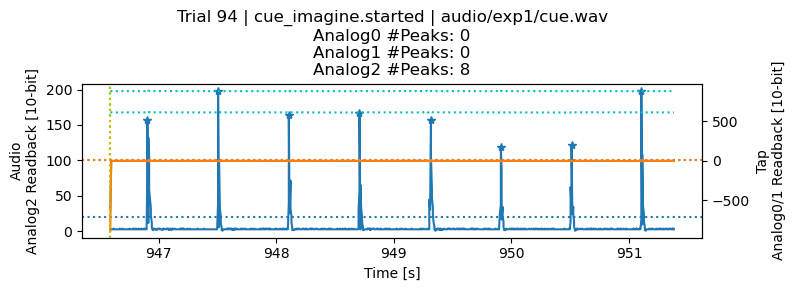

237900:240300
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


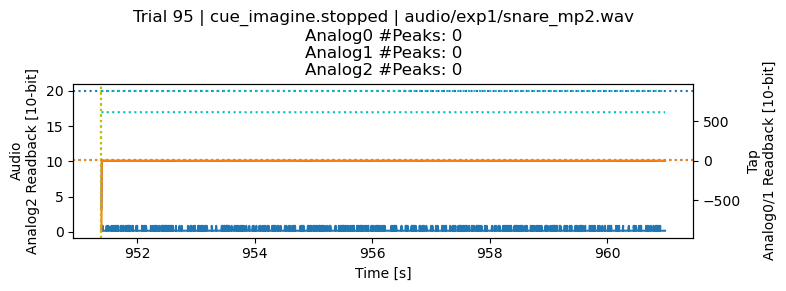

242400:243600
Analog0 Peaks [indices]: [275]
Analog1 Peaks [indices]: [ 81 299]
Analog2 Peaks [indices]: [  83  233  381  531  683  832  983 1133]


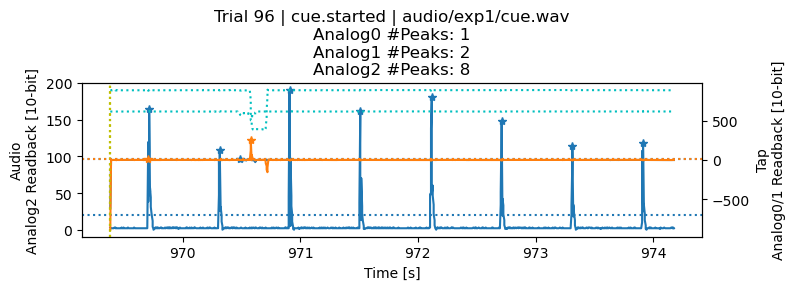

243600:246000
Analog0 Peaks [indices]: [ 234  349  552  766  955 1103 1303 1533 1703 1951 2088 2225]
Analog1 Peaks [indices]: [ 227  348  553  764  951 1095 1303 1532 1699 1949 2086 2219]
Analog2 Peaks [indices]: [  80  314  532  754  906 1056 1283 1513 1734 1958 2106 2256]


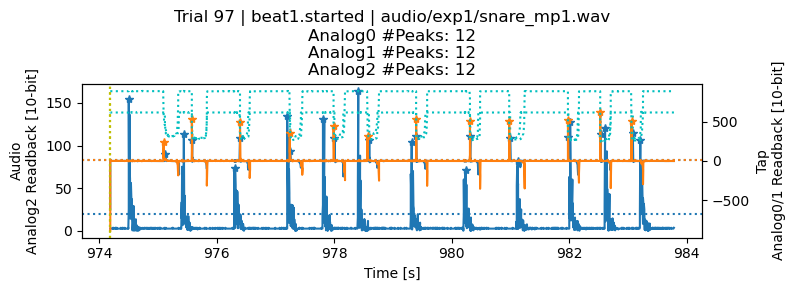

246105:247305
Analog0 Peaks [indices]: [1]
Analog1 Peaks [indices]: [232]
Analog2 Peaks [indices]: [  81  231  381  532  681  832  983 1131]


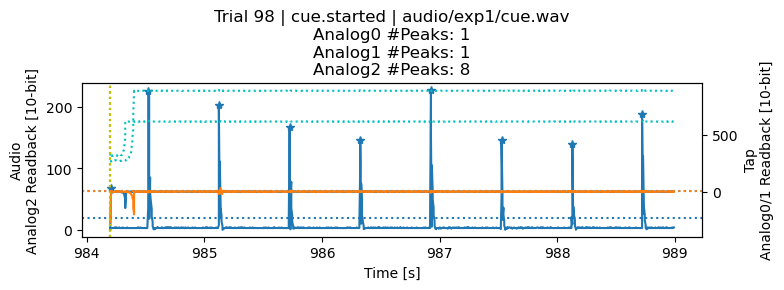

247304:249704
Analog0 Peaks [indices]: [  82  288  447  532  673  888 1035 1291 1512 1717 1873 2099 2283]
Analog1 Peaks [indices]: [  85  288  457  662  888 1029 1290 1525 1712 1877 2092 2279]
Analog2 Peaks [indices]: [  88  305  538  756  909 1060 1289 1512 1734 1956 2113 2256]


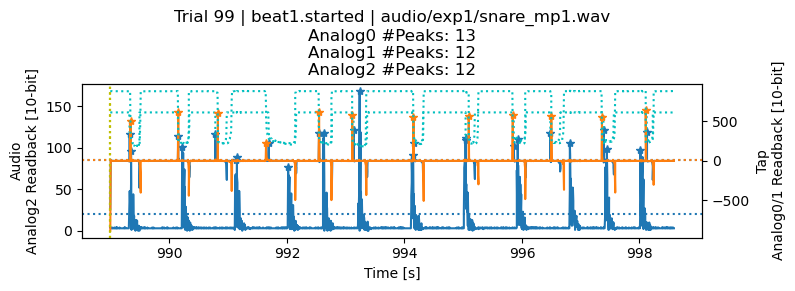

249808:251008
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  83  234  382  532  683  833  983 1134]


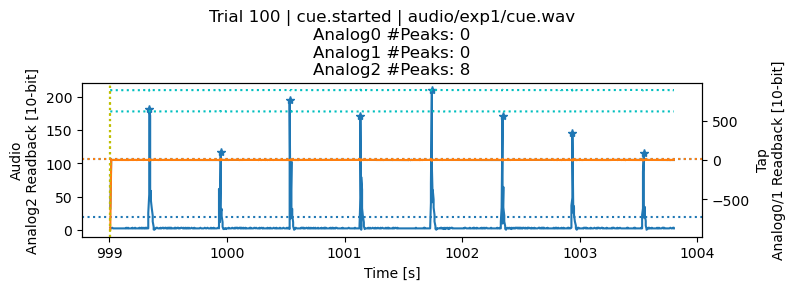

251004:253404
Analog0 Peaks [indices]: [  84  294  455  679  942 1050 1184 1530 1720 1921 2085 2278]
Analog1 Peaks [indices]: [  82  291  458  671  940 1045 1181 1531 1717 1918 2080 2273]
Analog2 Peaks [indices]: [  83  308  535  758  912 1057 1289 1512 1732 1956 2112 2257]


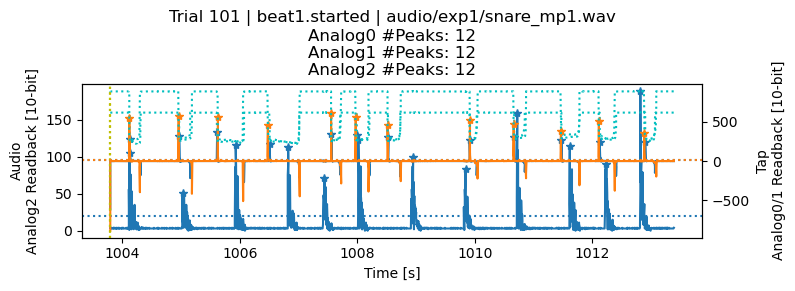

253512:254712
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  85  236  384  534  685  835  985 1136]


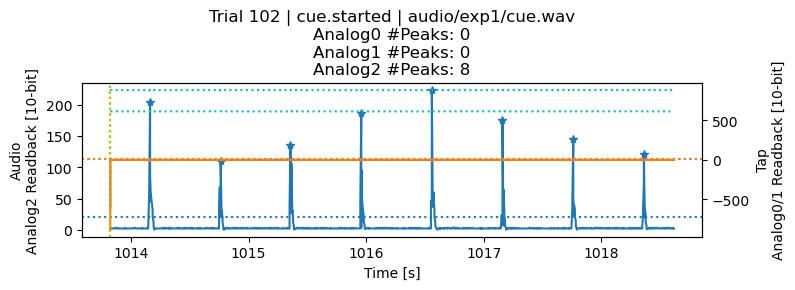

254712:257112
Analog0 Peaks [indices]: [ 107  312  458  785  916 1022 1302 1500 1714 1953 2086 2378]
Analog1 Peaks [indices]: [ 110  166  309  452  781  917 1022 1301 1486 1710 1933 2085 2373]
Analog2 Peaks [indices]: [  82  308  533  762  914 1062 1283 1511 1744 1965 2112 2258]


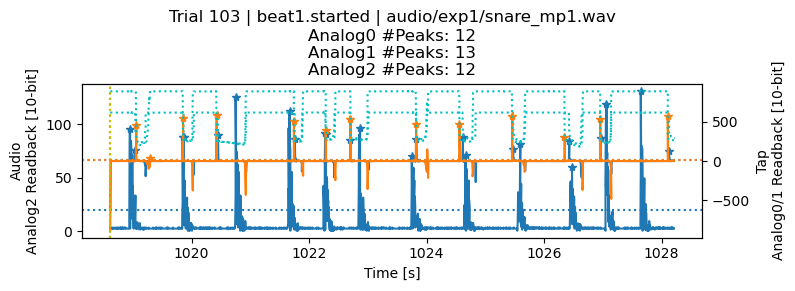

259212:260412
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  85  234  384  534  685  835  986 1134]


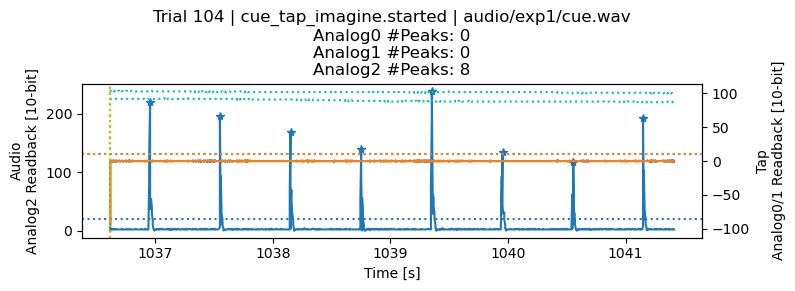

260412:262812
Analog0 Peaks [indices]: [ 119  337  539  786  938 1087 1231 1477 1720 1977 2120 2261]
Analog1 Peaks [indices]: [ 116  333  550  784  939 1089 1228 1472 1718 1978 2114 2258]
Analog2 Peaks [indices]: []


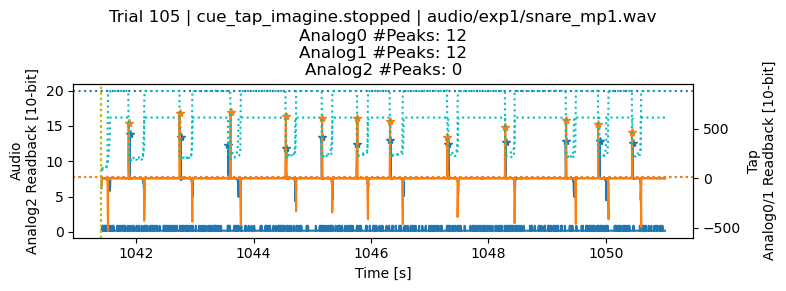

264912:266112
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [86]
Analog2 Peaks [indices]: [  85  236  386  536  687  835  985 1135]


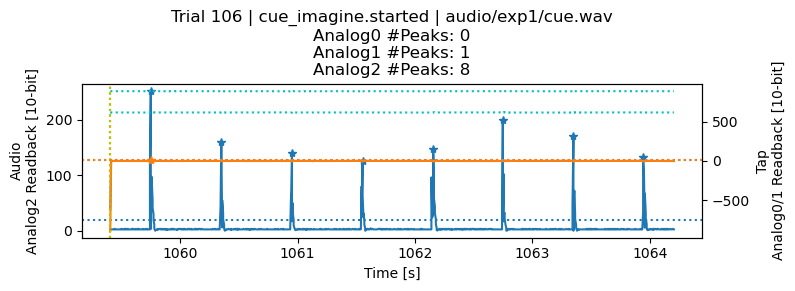

266112:268512
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


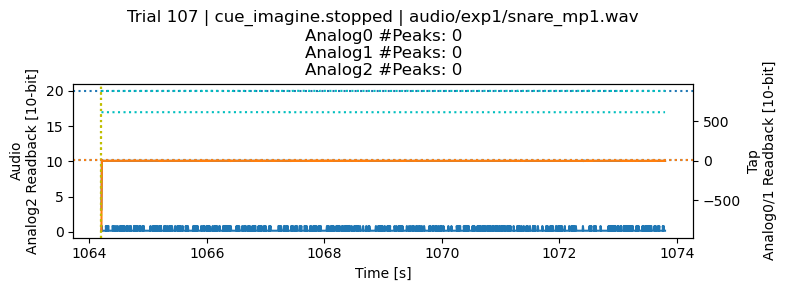

270616:271816
Analog0 Peaks [indices]: [459 559 850]
Analog1 Peaks [indices]: [472 531 854]
Analog2 Peaks [indices]: [  89  238  388  538  688  839  989 1140]


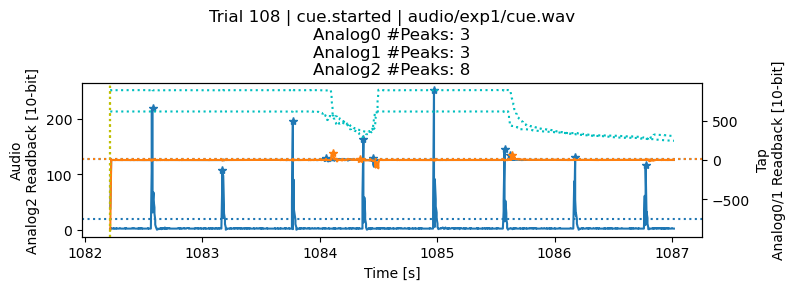

271813:274213
Analog0 Peaks [indices]: [ 288  416  535  666  810  975 1124 1278 1426 1575 1724 1877 2021 2168
 2311]
Analog1 Peaks [indices]: [ 288  399  531  666  809  970 1124 1277 1423 1572 1720 1873 2015 2169
 2310]
Analog2 Peaks [indices]: [  94  241  396  540  697  842  989 1138 1288 1443 1587 1738 1890 2037
 2196 2341]


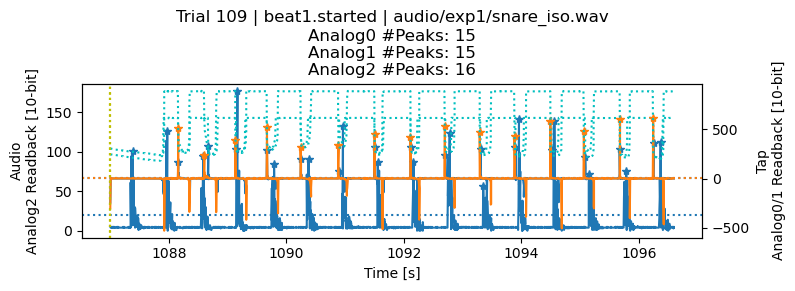

274316:275516
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [ 89 689]
Analog2 Peaks [indices]: [  88  239  389  540  688  838  988 1139]


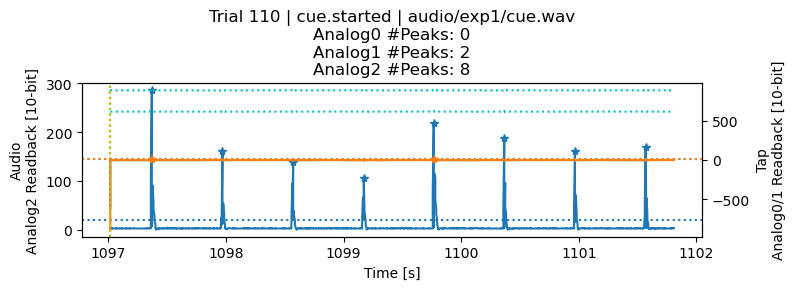

275511:277911
Analog0 Peaks [indices]: [  80  222  366  523  671  823  970 1112 1265 1417 1569 1716 1870 2020
 2168 2322]
Analog1 Peaks [indices]: [  74  223  360  521  670  817  966 1105 1260 1414 1562 1707 1866 2017
 2164 2316]
Analog2 Peaks [indices]: [  90  243  394  543  688  844  991 1138 1289 1442 1598 1740 1888 2040
 2188 2344]


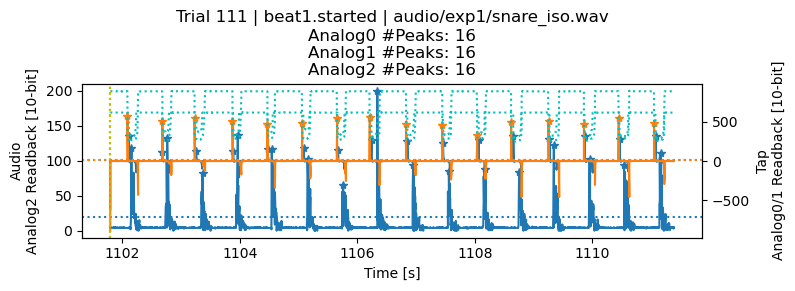

278015:279215
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [91]
Analog2 Peaks [indices]: [  90  239  389  540  689  840  991 1141]


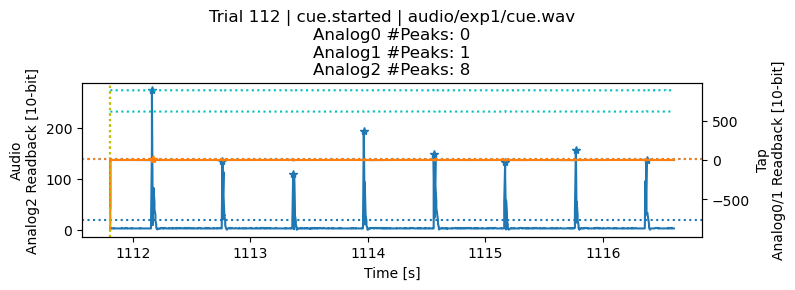

279211:281611
Analog0 Peaks [indices]: [  76  228  373  518  673  819  965 1116 1276 1419 1581 1728 1883 2036
 2195 2336]
Analog1 Peaks [indices]: [  82  227  368  518  669  814  966 1116 1274 1419 1584 1734 1877 2032
 2184 2331]
Analog2 Peaks [indices]: [  90  241  394  540  692  845  992 1145 1294 1441 1590 1743 1891 2042
 2190 2342]


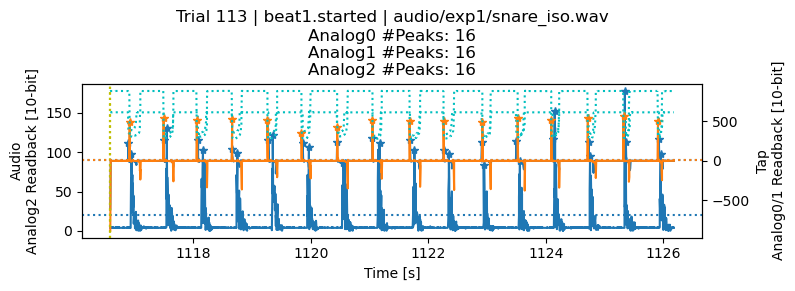

281715:282915
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [691]
Analog2 Peaks [indices]: [  90  241  391  541  690  842  990 1140]


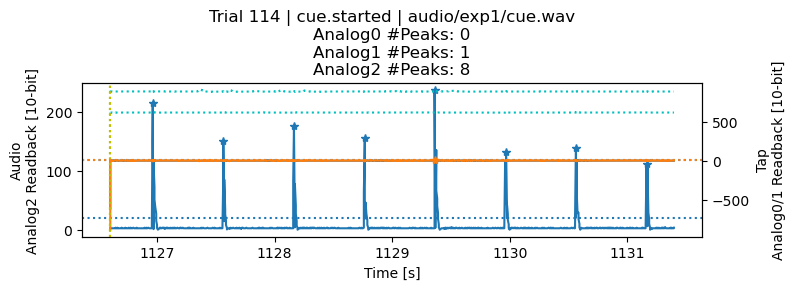

282911:285311
Analog0 Peaks [indices]: [  82  239  392  541  682  841  986 1120 1276 1420 1571 1736 1879 2028
 2174 2328]
Analog1 Peaks [indices]: [  82  234  386  537  684  841  985 1119 1269 1414 1569 1731 1876 2024
 2173 2326]
Analog2 Peaks [indices]: [  89  253  393  541  691  839  996 1145 1291 1443 1597 1743 1898 2046
 2195 2341]


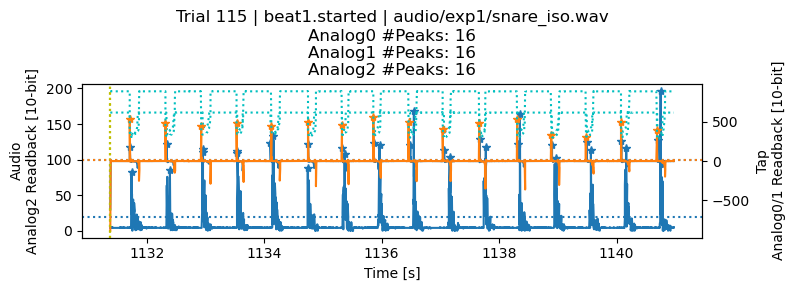

287415:288615
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  93  243  393  541  693  842  992 1143]


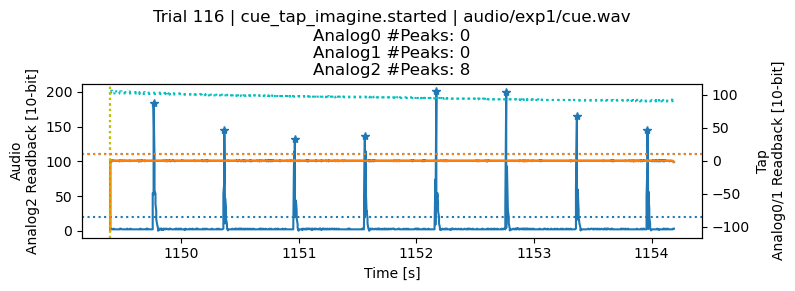

288615:291015
Analog0 Peaks [indices]: [ 108  259  417  573  738  881 1030 1184 1336 1492 1638 1779 1924 2077
 2234 2394]
Analog1 Peaks [indices]: [ 105  260  423  571  738  877 1031 1182 1334 1491 1636 1776 1924 2075
 2227 2391]
Analog2 Peaks [indices]: []


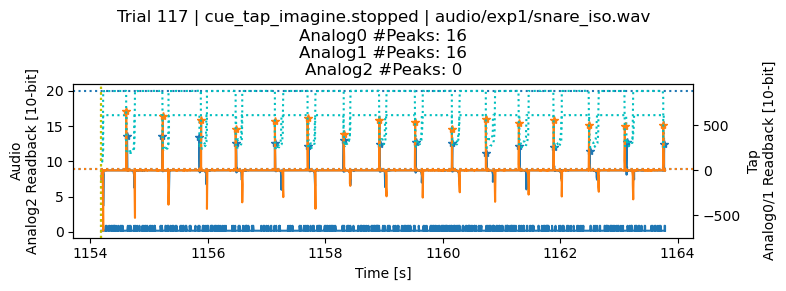

293120:294320
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [92]
Analog2 Peaks [indices]: [  91  242  392  542  691  841  991 1142]


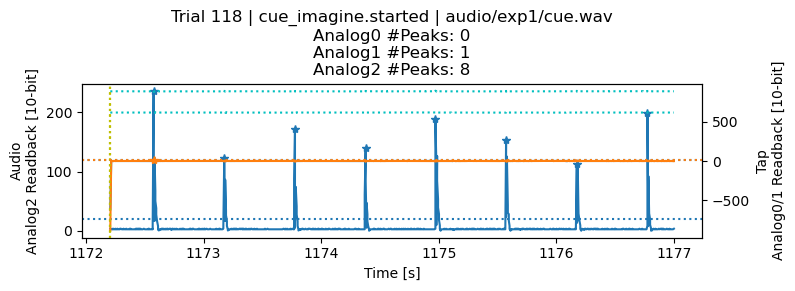

294320:296720
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


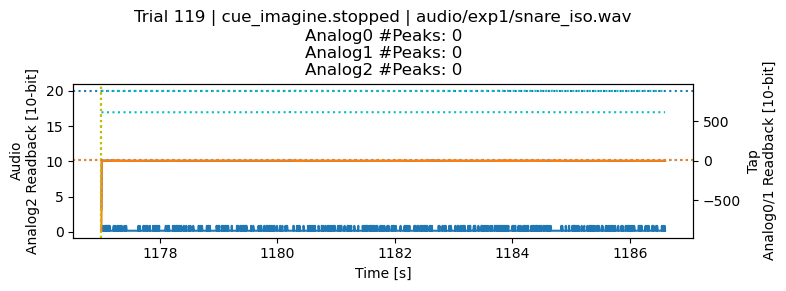

298819:300019
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [ 96 696]
Analog2 Peaks [indices]: [  95  247  395  545  695  846  996 1147]


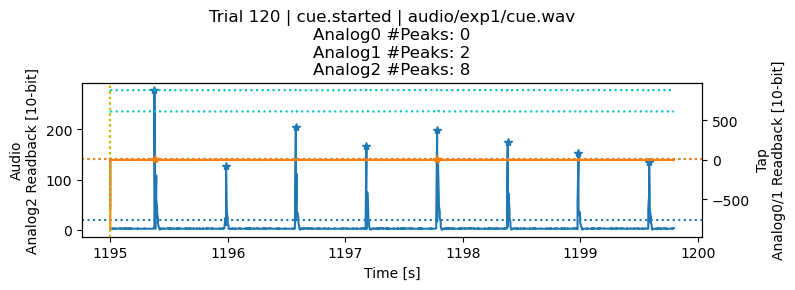

300015:302415
Analog0 Peaks [indices]: [ 299  452  648  768 1404 1518 1847 1966 2235]
Analog1 Peaks [indices]: [ 296  448  647  764 1403 1515 1847 1960 2230]
Analog2 Peaks [indices]: [ 174  319  619  846  995 1372 1521 1825 1971 2196]


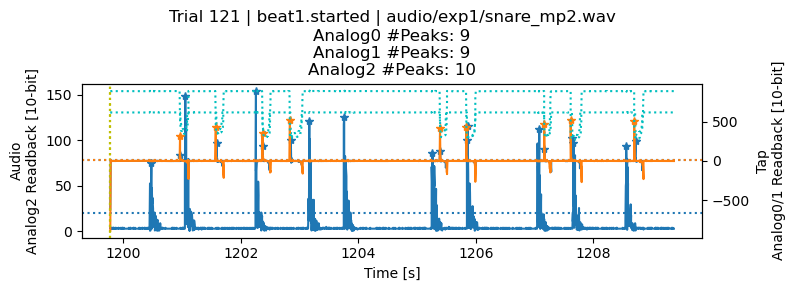

302519:303719
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  98  246  396  546  698  847  998 1148]


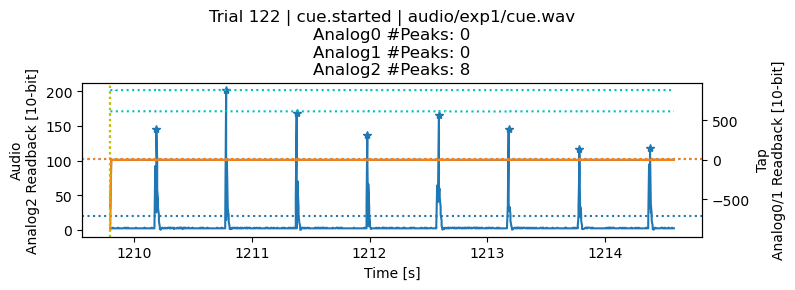

303715:306115
Analog0 Peaks [indices]: [ 120  351  650  801  891 1011 1315 1495 1851 1977 2145]
Analog1 Peaks [indices]: [ 117  349  653  884 1007 1312 1488 1838 1964 2143]
Analog2 Peaks [indices]: [ 171  327  625  848  996 1372 1526 1819 1973 2196]


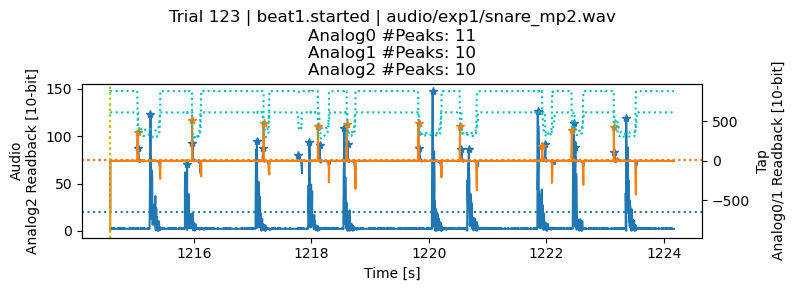

306220:307420
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [97]
Analog2 Peaks [indices]: [  96  246  397  547  698  848  998 1146]


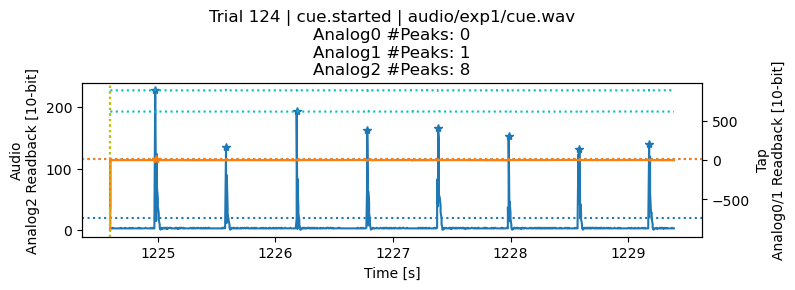

307420:309820
Analog0 Peaks [indices]: [ 104  317  554  873  985 1271 1489 1814 1944 2230]
Analog1 Peaks [indices]: [  99  306  552  870  977 1272 1474 1800 1932 2222]
Analog2 Peaks [indices]: [ 172  325  623  847 1003 1373 1525 1822 1974 2195]


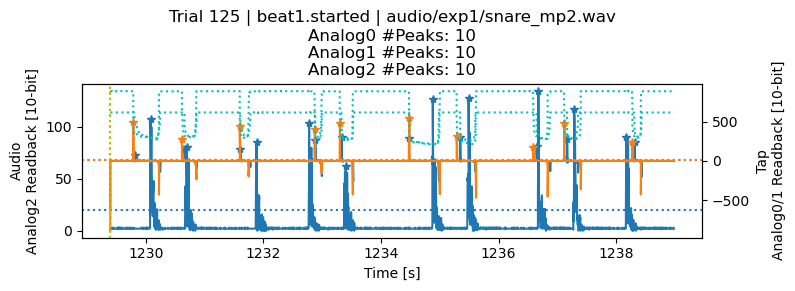

309919:311119
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  99  249  397  547  699  848  999 1149]


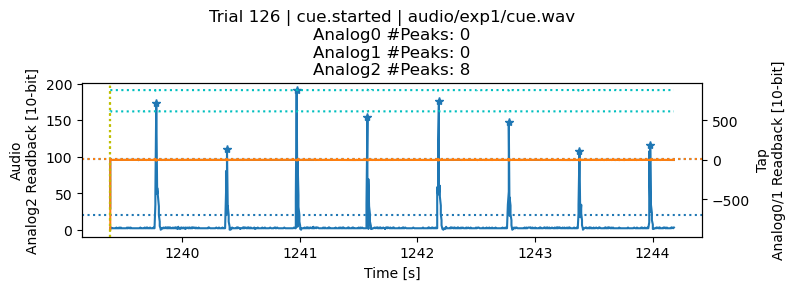

311115:313515
Analog0 Peaks [indices]: [ 217  333  579  724  967 1293 1475 1819 1943 2243]
Analog1 Peaks [indices]: [ 217  333  574  713  962 1282 1466 1812 1941 2243]
Analog2 Peaks [indices]: [ 176  321  626  846 1000 1374 1531 1824 1973 2197]


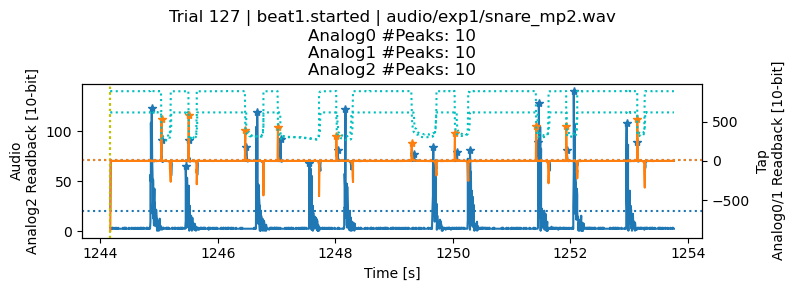

315619:316819
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [  98  248  399  549  698  850 1000 1148]


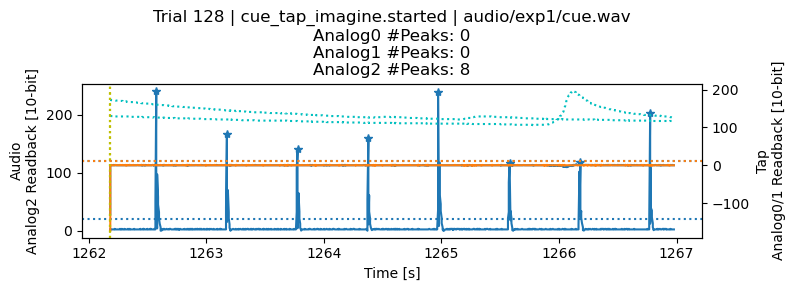

316819:319219
Analog0 Peaks [indices]: [ 111  260  513  817  971 1224 1390 1695 1864 2159]
Analog1 Peaks [indices]: [ 109  255  513  817  970 1222 1387 1692 1863 2161]
Analog2 Peaks [indices]: []


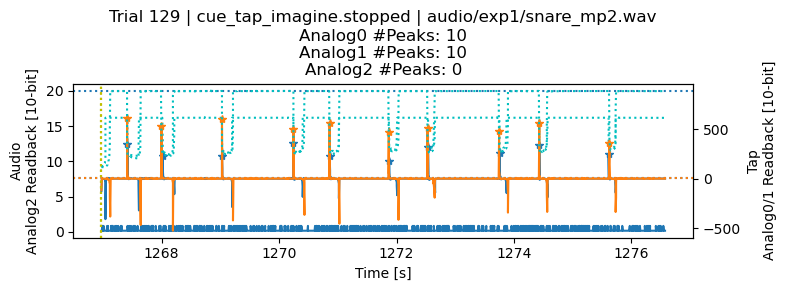

321320:322520
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [101 700]
Analog2 Peaks [indices]: [ 100  250  400  550  699  849  999 1150]


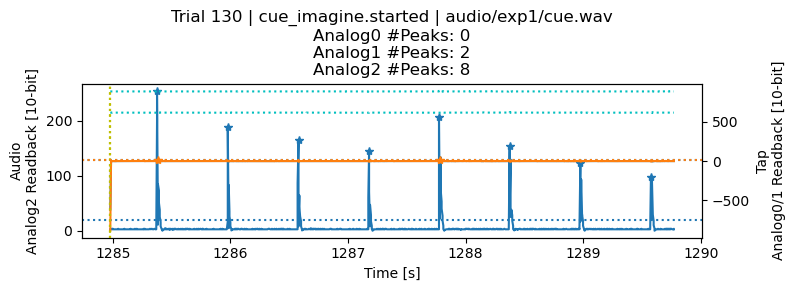

322520:324920
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


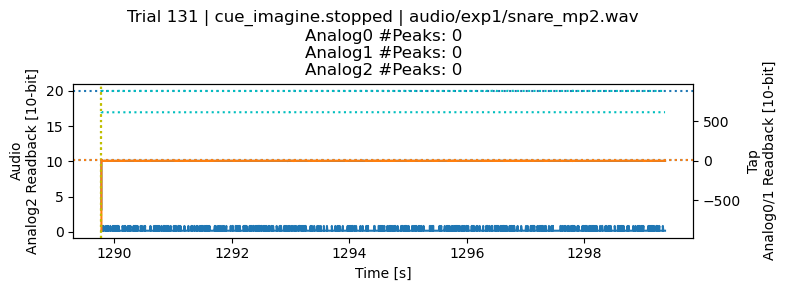

327019:328219
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [ 94 701]
Analog2 Peaks [indices]: [ 100  251  402  552  703  851 1001 1151]


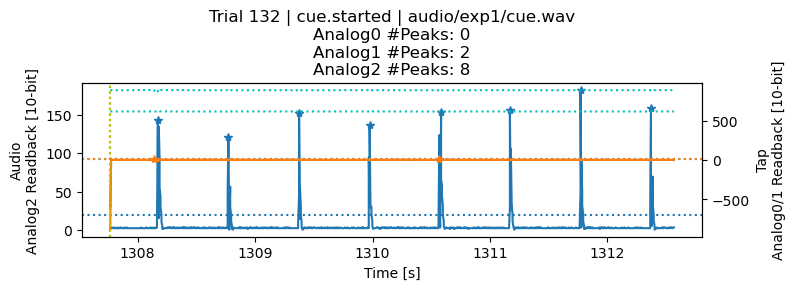

328218:330618
Analog0 Peaks [indices]: [ 126  255  471  808  916 1069 1323 1531 1768 1890 2090 2279]
Analog1 Peaks [indices]: [ 128  249  465  805  914 1063 1319 1528 1765 1886 2085]
Analog2 Peaks [indices]: [ 104  327  557  779  930 1079 1307 1527 1756 1978 2129 2277]


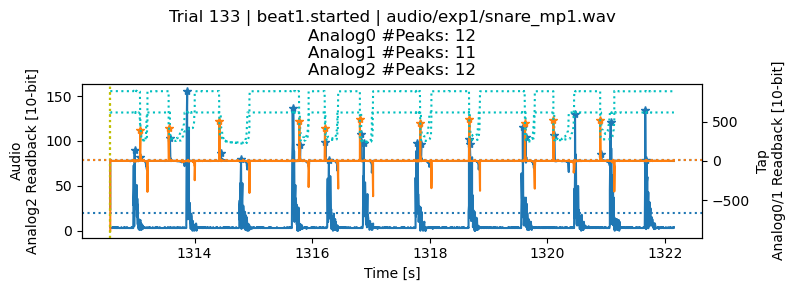

330718:331918
Analog0 Peaks [indices]: [ 57 921]
Analog1 Peaks [indices]: [ 40 841 920]
Analog2 Peaks [indices]: [ 104  254  404  552  704  853 1003 1153]


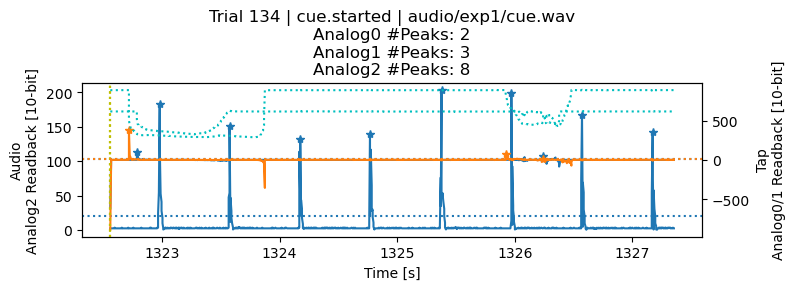

331914:334314
Analog0 Peaks [indices]: [ 124  319  473  692  905 1041 1206 1543 1751 1960 2086 2233]
Analog1 Peaks [indices]: [ 124  311  469  685  898 1037 1201 1523 1746 1956 2081 2230]
Analog2 Peaks [indices]: [ 111  329  557  787  933 1081 1301 1533 1754 1976 2129 2282]


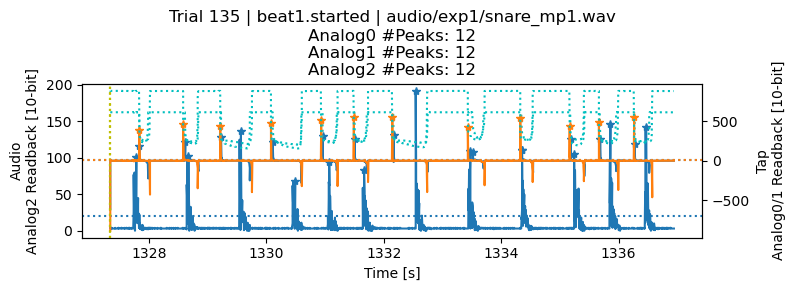

334418:335618
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [554 705]
Analog2 Peaks [indices]: [ 104  255  403  553  704  854 1004 1154]


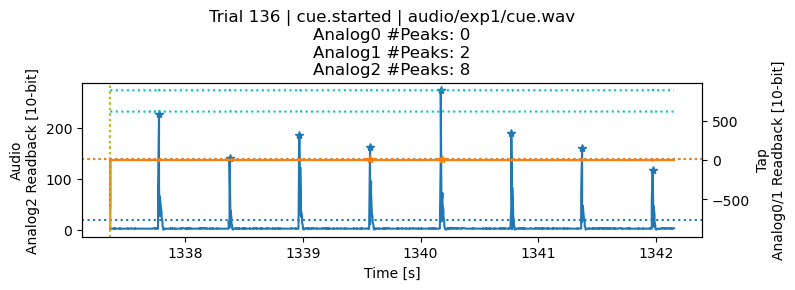

335614:338014
Analog0 Peaks [indices]: [ 102  314  477  786  930 1050 1191 1495 1747 1954 2106 2243]
Analog1 Peaks [indices]: [  96  307  470  778  928 1045 1184 1490 1748 1951 2104 2239]
Analog2 Peaks [indices]: [ 109  328  555  782  928 1077 1308 1533 1754 1979 2127 2278]


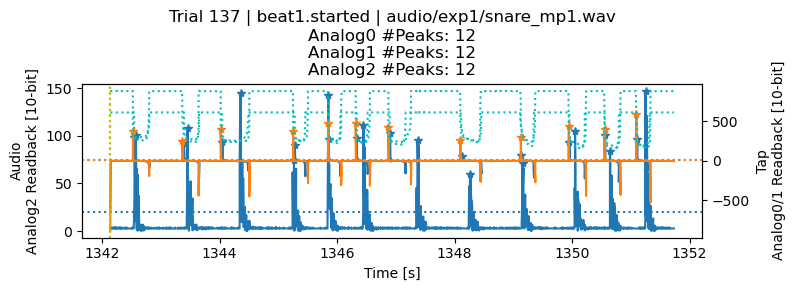

338122:339322
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [106 705]
Analog2 Peaks [indices]: [ 105  255  405  555  704  854 1004 1154]


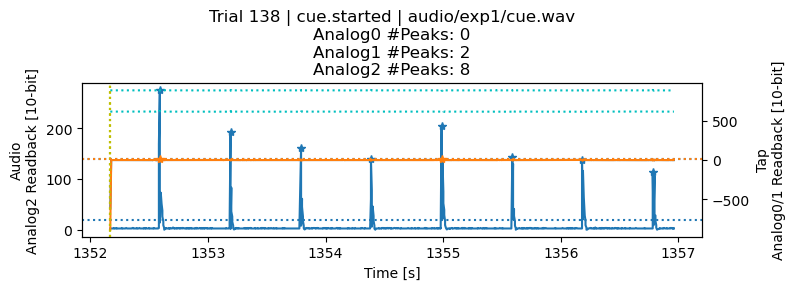

339318:341718
Analog0 Peaks [indices]: [ 101  205  321  517  786  923 1058 1237 1517 1733 1963 2100 2251]
Analog1 Peaks [indices]: [  94  309  514  778  919 1052 1229 1516 1735 1959 2095 2250]
Analog2 Peaks [indices]: [ 107  329  558  780  931 1078 1304 1533 1754 1979 2129 2279]


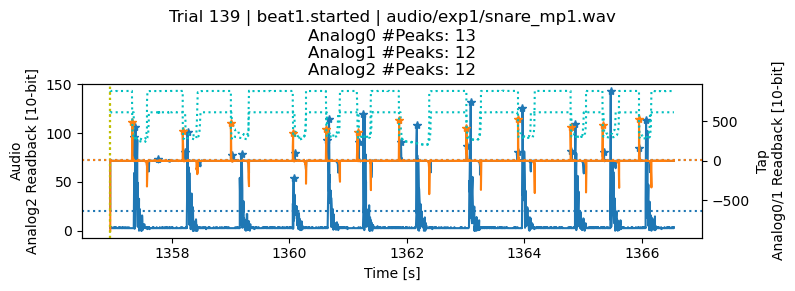

343822:345022
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 106  255  405  555  706  856 1007 1157]


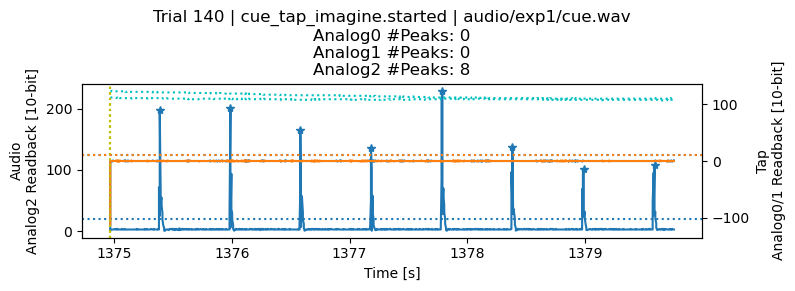

345022:347422
Analog0 Peaks [indices]: [ 145  373  550  842  990 1122 1261 1529 1753 2036 2190 2334]
Analog1 Peaks [indices]: [ 140  377  548  843  983 1116 1259 1531 1748 2040 2188 2332]
Analog2 Peaks [indices]: []


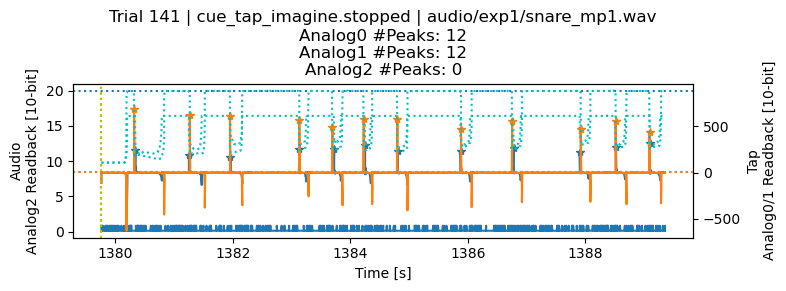

349522:350722
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [107 706]
Analog2 Peaks [indices]: [ 106  257  407  557  708  856 1006 1156]


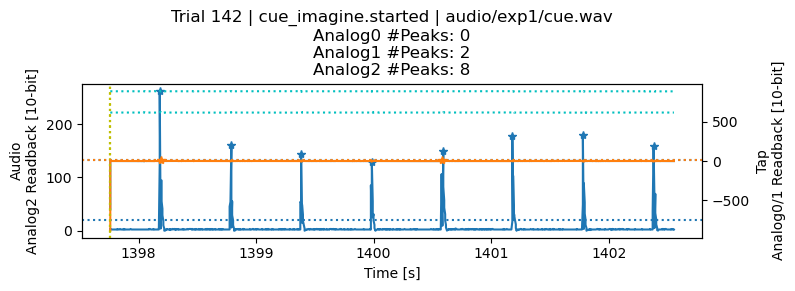

350722:353122
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


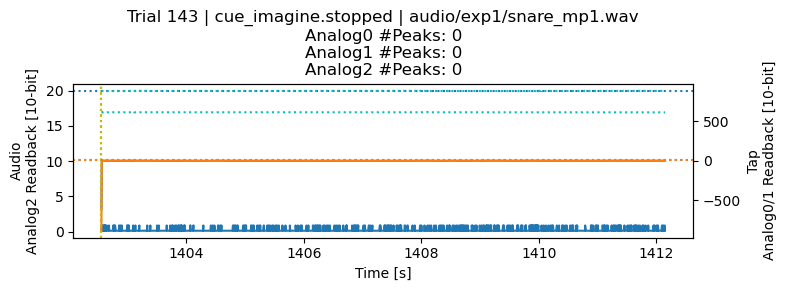

355223:356423
Analog0 Peaks [indices]: [304 354 495]
Analog1 Peaks [indices]: [108 286 491]
Analog2 Peaks [indices]: [ 107  258  408  559  709  857 1007 1158]


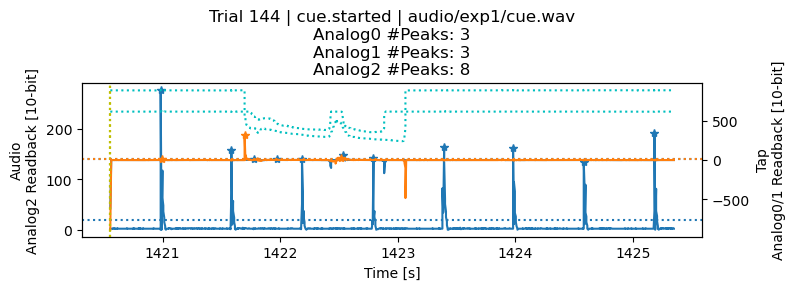

356418:358818
Analog0 Peaks [indices]: [ 141  319  493  813  939 1072 1229 1515 1737 1982 2124 2255]
Analog1 Peaks [indices]: [ 143  317  492  814  938 1063 1223 1511 1738 1980 2117 2246]
Analog2 Peaks [indices]: [ 113  343  558  783  937 1084 1307 1538 1761 1983 2134 2286]


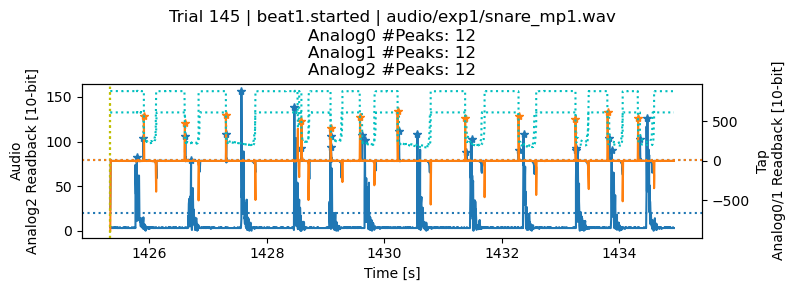

358922:360122
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 109  260  408  558  708  859 1009 1159]


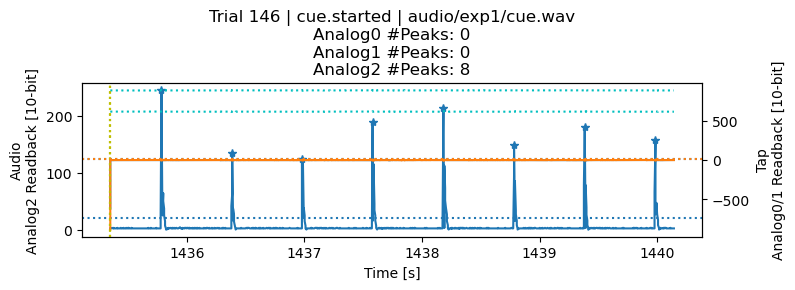

360118:362518
Analog0 Peaks [indices]: [ 130  330  521  817  956 1072 1335 1523 1737 1995 2134 2253]
Analog1 Peaks [indices]: [ 128  330  521  816  956 1067 1332 1511 1733 1987 2139 2250]
Analog2 Peaks [indices]: [ 112  334  567  790  943 1087 1308 1536 1759 1985 2140 2284]


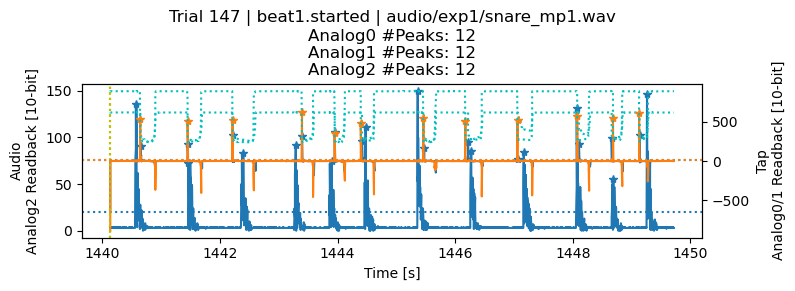

362626:363826
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 109  258  409  559  709  859 1010 1160]


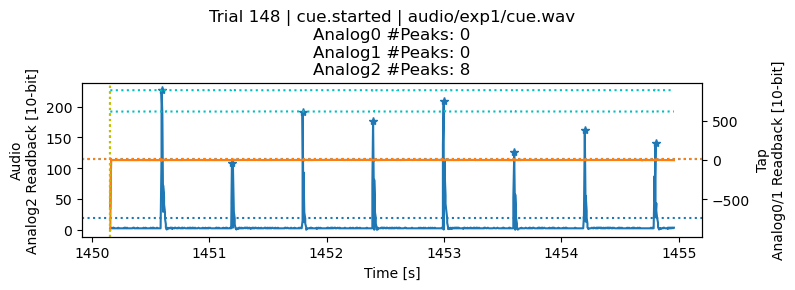

363822:366222
Analog0 Peaks [indices]: [ 121  181  319  494  793  923 1060 1216 1314 1535 1737 1969 2114 2254]
Analog1 Peaks [indices]: [ 124  314  490  790  921 1056 1210 1538 1739 1963 2111 2252]
Analog2 Peaks [indices]: [ 109  338  561  783  942 1087 1308 1537 1759 1987 2139 2287]


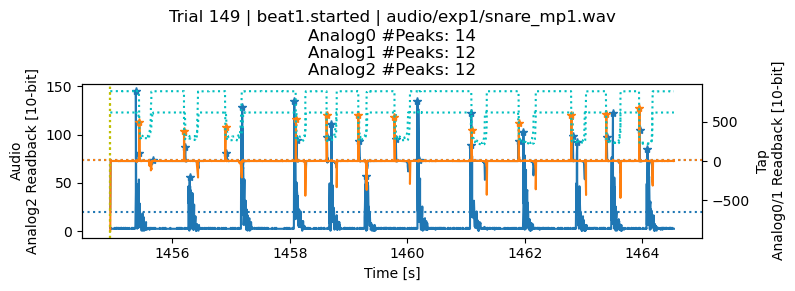

366326:367526
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 112  261  412  562  711  860 1010 1161]


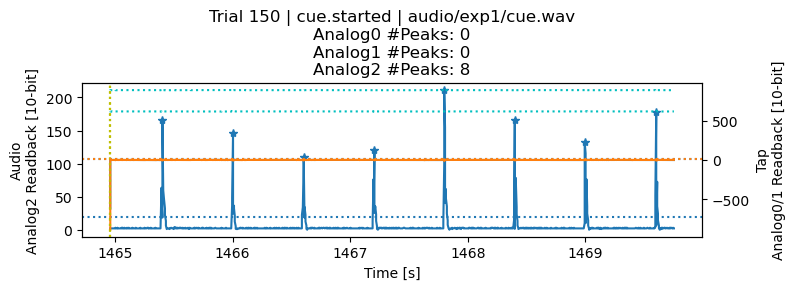

367526:369926
Analog0 Peaks [indices]: [ 114  345  527  818  940 1061 1225 1544 1772 1988 2124 2262]
Analog1 Peaks [indices]: [ 114  348  549  819  939 1057 1226 1538 1767 1992 2122 2256]
Analog2 Peaks [indices]: [ 110  336  561  784  939 1090 1309 1539 1760 1984 2135 2289]


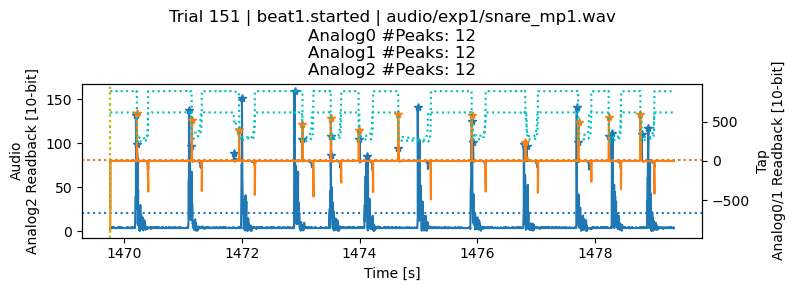

372030:373230
Analog0 Peaks [indices]: [730]
Analog1 Peaks [indices]: [112 509]
Analog2 Peaks [indices]: [ 111  262  412  563  711  861 1011 1162]


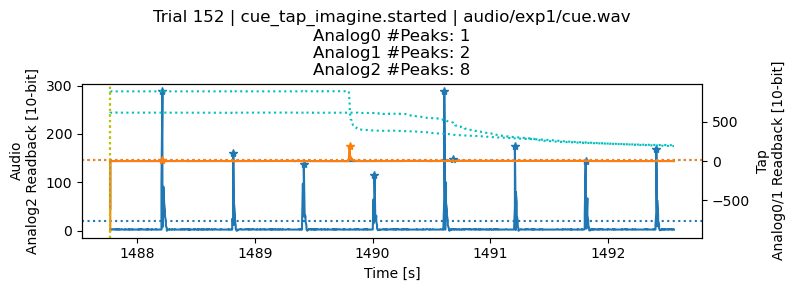

373230:375630
Analog0 Peaks [indices]: [ 132  371  556  801  955 1086 1229 1472 1674 1941 2090 2224]
Analog1 Peaks [indices]: [ 137  373  560  796  953 1089 1234 1468 1672 1939 2094 2228]
Analog2 Peaks [indices]: []


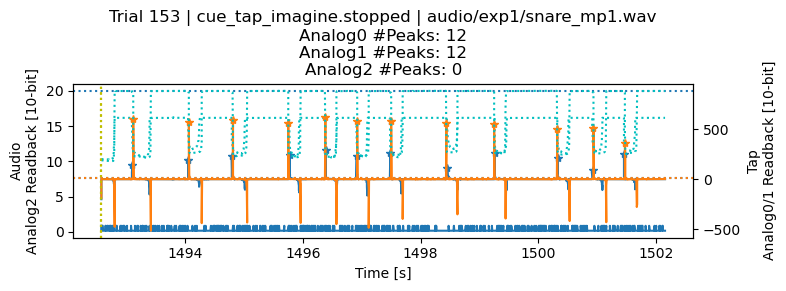

377734:378934
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 114  263  413  563  714  862 1012 1162]


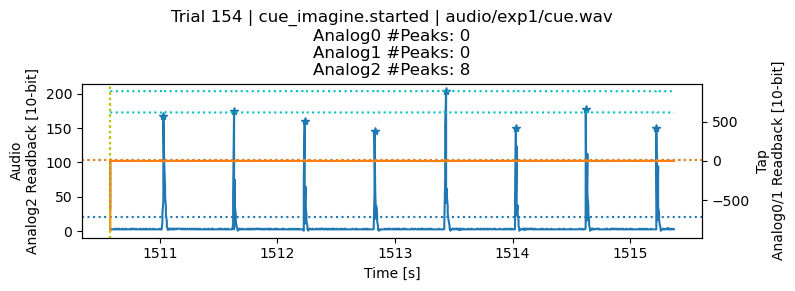

378934:381334
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


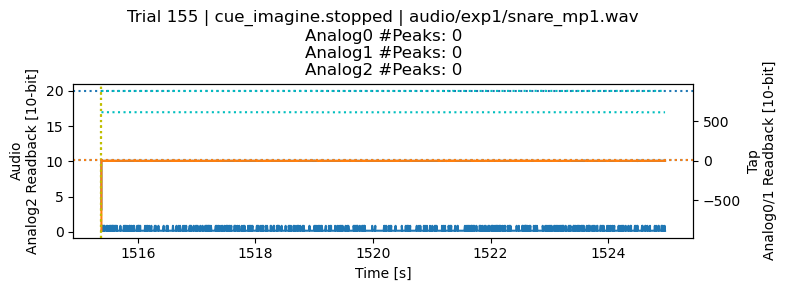

383434:384634
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 116  264  414  564  716  865 1015 1166]


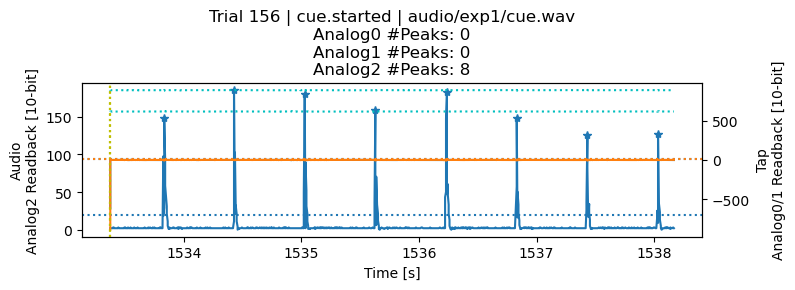

384630:387030
Analog0 Peaks [indices]: [ 115  304  414  545  696  840  987 1155 1401 1464 1591 1765 1904 2051
 2200 2359]
Analog1 Peaks [indices]: [ 114  309  407  542  694  834  984 1154 1400 1603 1759 1900 2053 2201
 2356]
Analog2 Peaks [indices]: [ 114  264  418  567  714  866 1012 1163 1321 1470 1613 1763 1920 2066
 2219 2364]


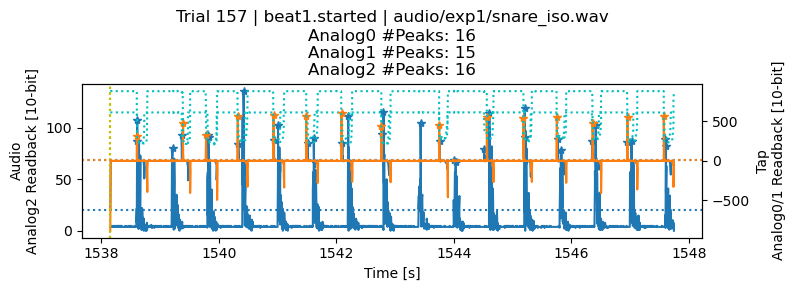

387134:388334
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 116  265  415  566  716  866 1017 1167]


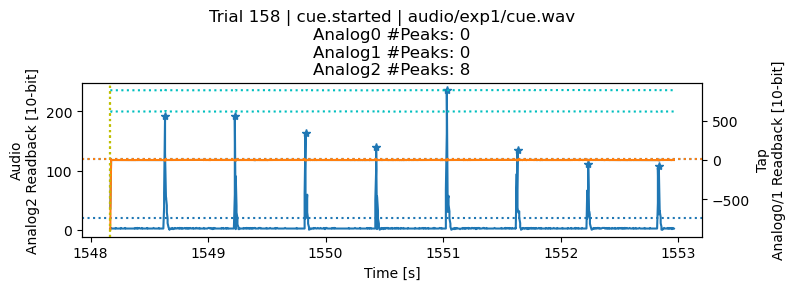

388329:390729
Analog0 Peaks [indices]: [ 111  254  395  549  691  835  995 1144 1286 1441 1595 1749 1893 2038
 2192 2353]
Analog1 Peaks [indices]: [ 117  251  394  542  694  836  985 1150 1286 1438 1596 1753 1893 2043
 2188 2351]
Analog2 Peaks [indices]: [ 118  265  418  564  721  866 1015 1169 1317 1467 1619 1765 1917 2071
 2214 2366]


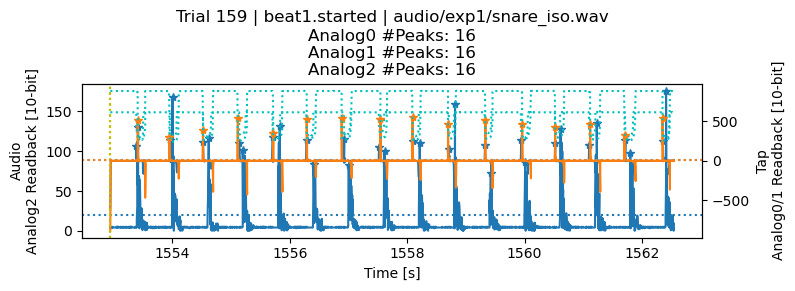

390834:392034
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [716]
Analog2 Peaks [indices]: [ 115  266  416  566  715  867 1015 1165]


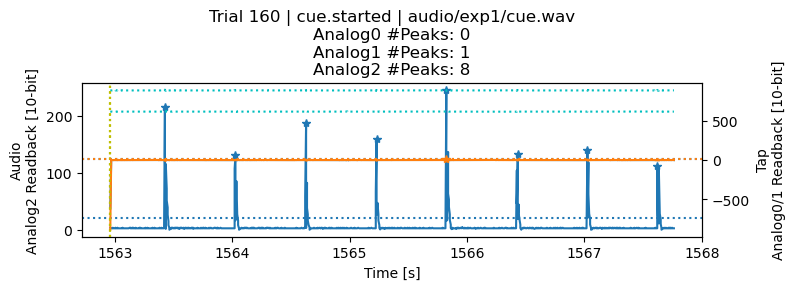

392035:394435
Analog0 Peaks [indices]: [ 107  247  394  547  696  838 1001 1147 1292 1442 1586 1751 1900 2057
 2198 2352]
Analog1 Peaks [indices]: [ 107  250  394  547  698  845  999 1145 1292 1441 1587 1748 1899 2048
 2201 2347]
Analog2 Peaks [indices]: [ 116  267  420  568  720  869 1015 1164 1318 1468 1617 1769 1914 2066
 2214 2370]


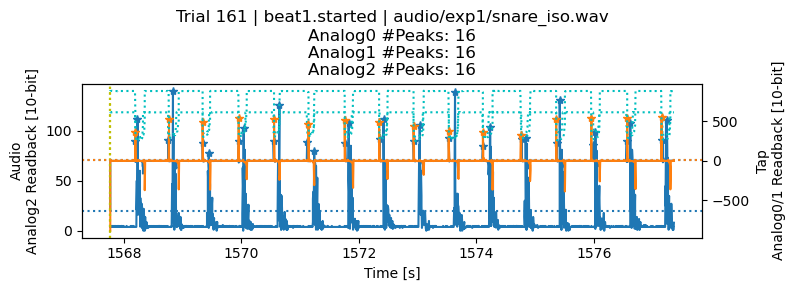

394538:395738
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [118]
Analog2 Peaks [indices]: [ 117  266  416  567  716  868 1018 1168]


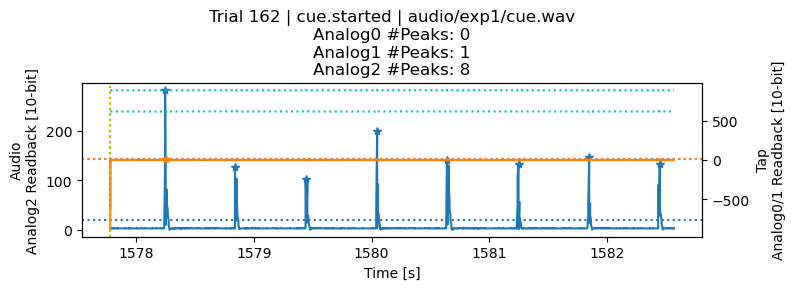

395734:398134
Analog0 Peaks [indices]: [ 119  239  383  534  701  847  996 1150 1301 1451 1607 1755 1896 2052
 2206 2356]
Analog1 Peaks [indices]: [ 121  243  390  536  691  846  993 1148 1298 1449 1607 1749 1898 2045
 2206 2353]
Analog2 Peaks [indices]: [ 123  275  419  568  715  866 1024 1176 1318 1466 1620 1772 1925 2069
 2216 2366]


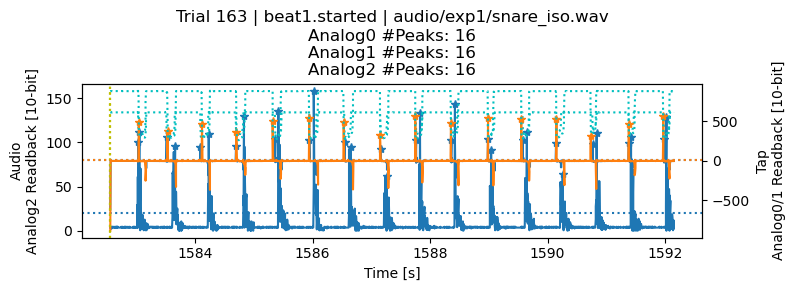

400246:401446
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 117  267  417  568  717  869 1019 1167]


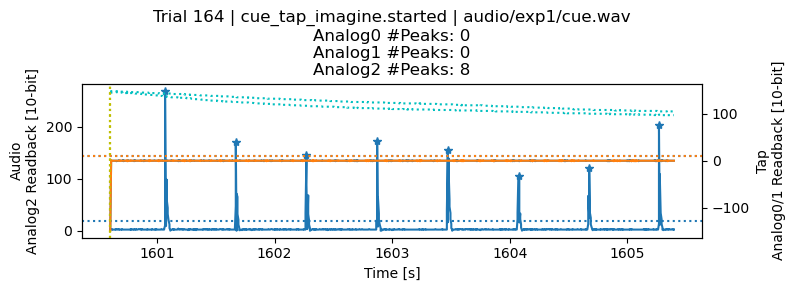

401447:403847
Analog0 Peaks [indices]: [ 115  255  407  557  713  875 1021 1180 1319 1478 1617 1763 1908 2053
 2196 2337]
Analog1 Peaks [indices]: [ 116  253  411  553  711  869 1022 1175 1320 1465 1619 1760 1910 2049
 2194 2337]
Analog2 Peaks [indices]: []


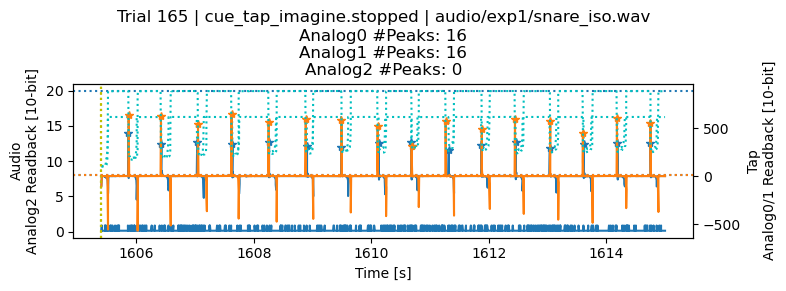

405946:407146
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [120 720]
Analog2 Peaks [indices]: [ 119  270  420  571  719  869 1019 1170]


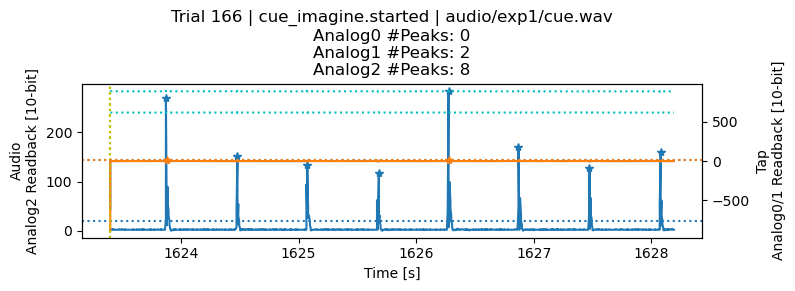

407146:409546
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


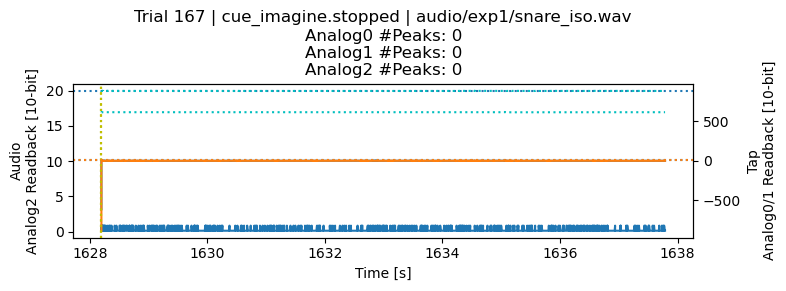

411646:412846
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 121  270  421  571  720  871 1022 1172]


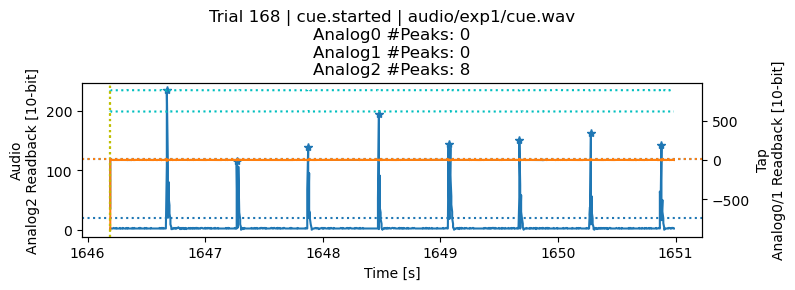

412843:415243
Analog0 Peaks [indices]: [ 375  631  774  984 1311 1514 1865 1990 2249]
Analog1 Peaks [indices]: [ 366  631  773  985 1309 1508 1866 1989 2251]
Analog2 Peaks [indices]: [ 199  345  645  875 1022 1395 1554 1846 1996 2224]


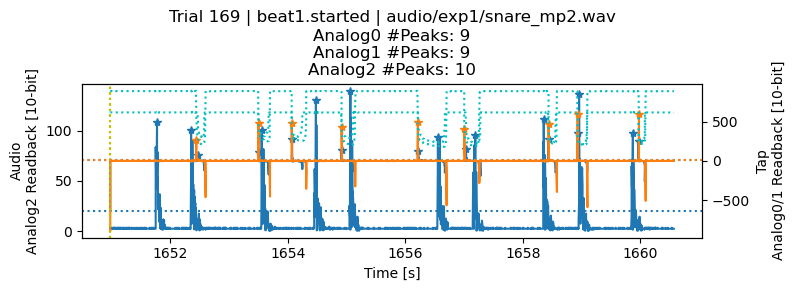

415342:416542
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [723]
Analog2 Peaks [indices]: [ 123  272  422  572  722  873 1023 1173]


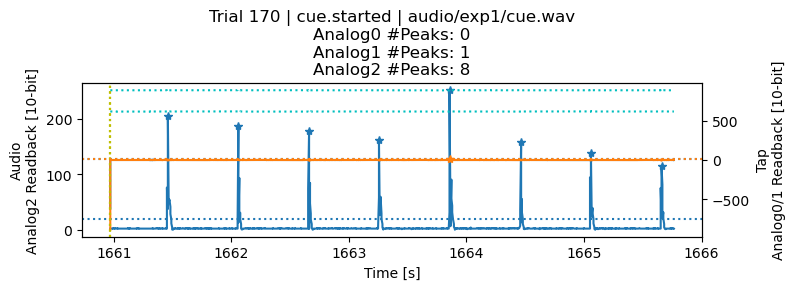

416541:418941
Analog0 Peaks [indices]: [ 135  375  520  903 1020 1346 1515 1845 1988 2248]
Analog1 Peaks [indices]: [ 127  376  534  901 1015 1346 1509 1848 1983 2247]
Analog2 Peaks [indices]: [ 196  354  648  872 1022 1398 1548 1846 1996 2226]


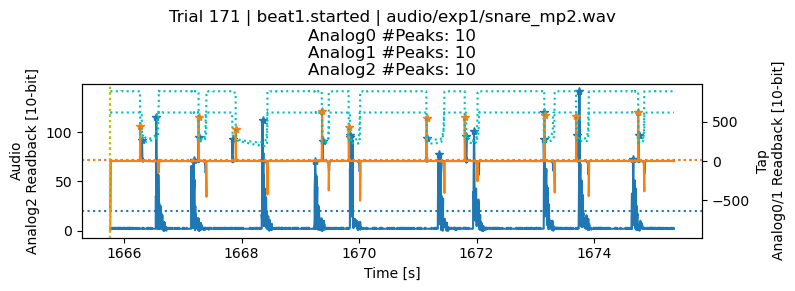

419041:420241
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [124 723]
Analog2 Peaks [indices]: [ 123  272  422  573  722  873 1024 1174]


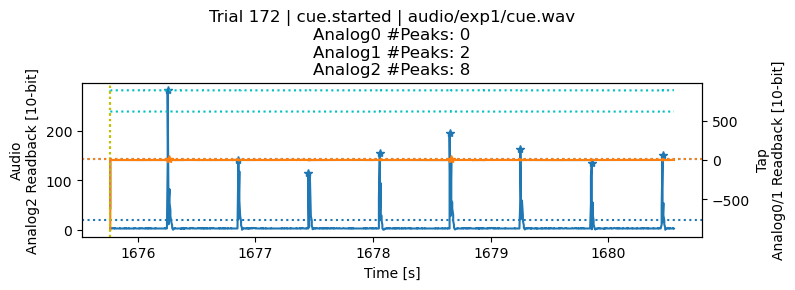

420241:422641
Analog0 Peaks [indices]: [ 112  197  315  607  773  989 1325 1519 1848 2015 2258]
Analog1 Peaks [indices]: [ 107  316  602  766  989 1322 1514 1837 2023 2255]
Analog2 Peaks [indices]: [ 195  348  646  875 1026 1399 1545 1848 2004 2224]


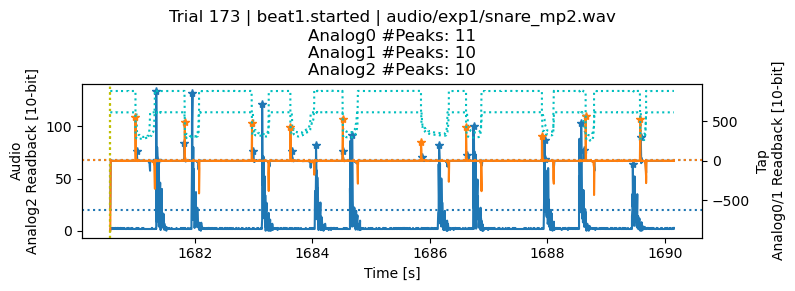

422741:423941
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [125]
Analog2 Peaks [indices]: [ 124  276  424  574  726  875 1025 1175]


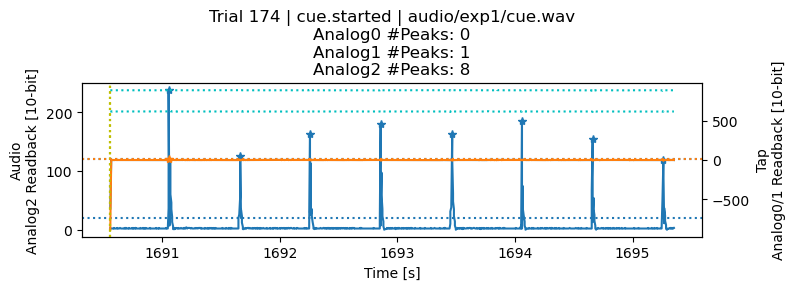

423941:426341
Analog0 Peaks [indices]: [ 133  337  575  871 1014 1283 1400 1514 1842 1980 2251]
Analog1 Peaks [indices]: [ 130  335  570  884 1009 1274 1399 1507 1845 1973 2255]
Analog2 Peaks [indices]: [ 199  351  647  873 1022 1398 1556 1848 2002 2226]


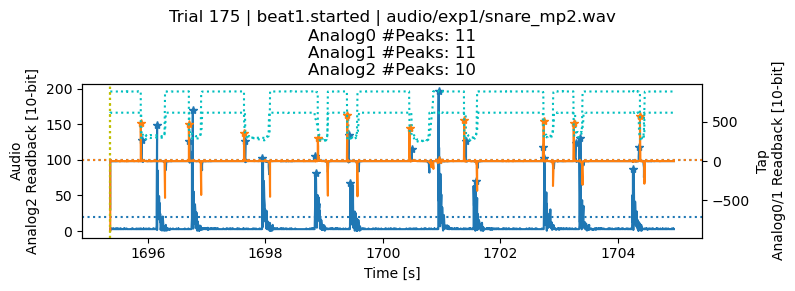

428445:429645
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 126  275  426  574  726  874 1025 1175]


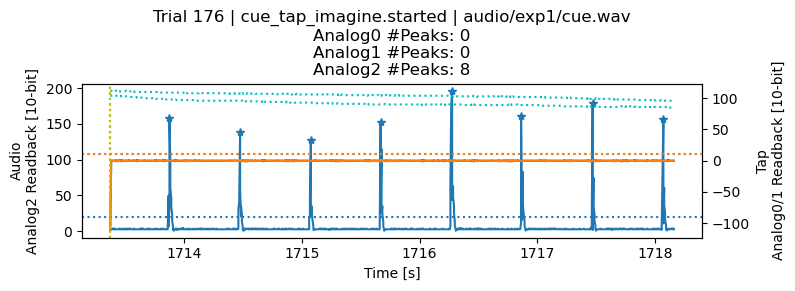

429645:432045
Analog0 Peaks [indices]: [ 128  283  549  895 1052 1438 1583 1970 2137]
Analog1 Peaks [indices]: [ 130  283  546  888 1055 1428 1585 1961 2135]
Analog2 Peaks [indices]: []


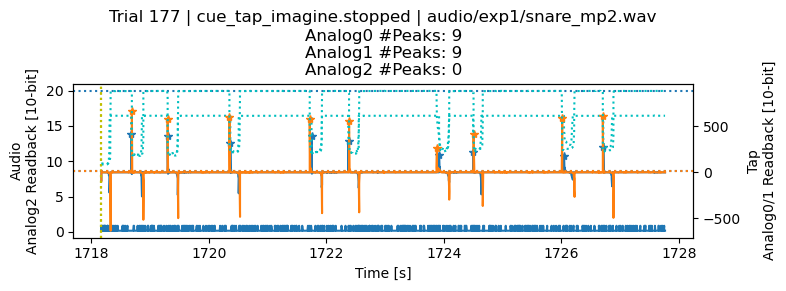

434145:435345
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [726]
Analog2 Peaks [indices]: [ 125  275  425  575  725  876 1027 1177]


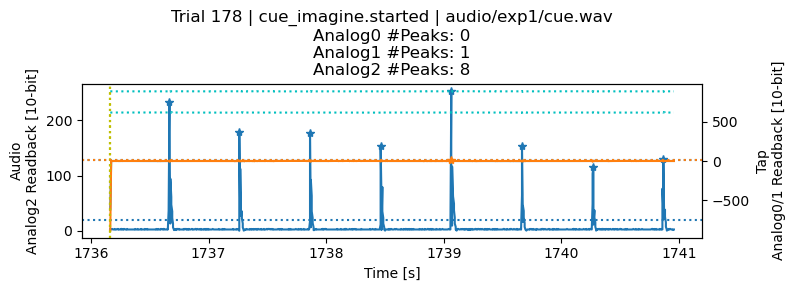

435345:437745
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


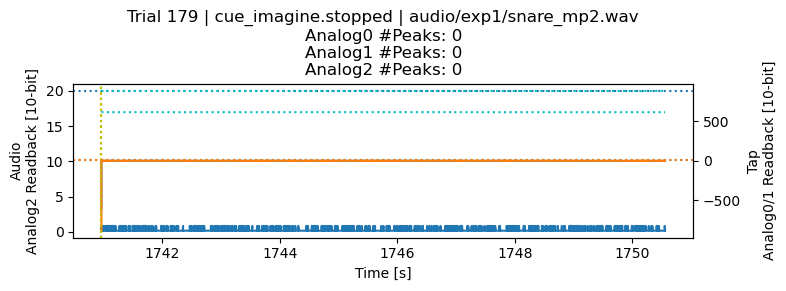

439845:441045
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 127  277  427  577  727  878 1028 1179]


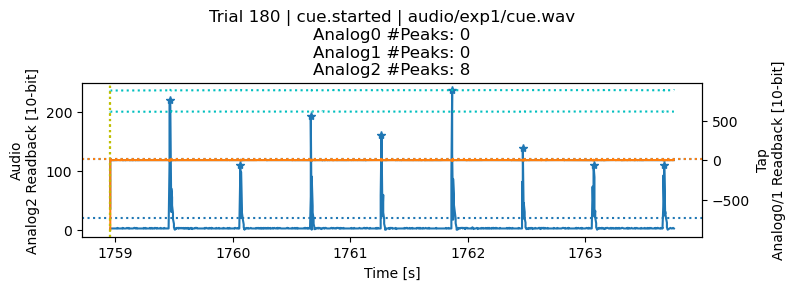

441041:443441
Analog0 Peaks [indices]: [ 259  381  502  913 1028 1317 1409 1509 1838 1979 2258 2376]
Analog1 Peaks [indices]: [ 250  383  495  916 1022 1321 1503 1855 1973 2258 2390]
Analog2 Peaks [indices]: [ 203  353  656  885 1034 1401 1554 1851 2003 2233]


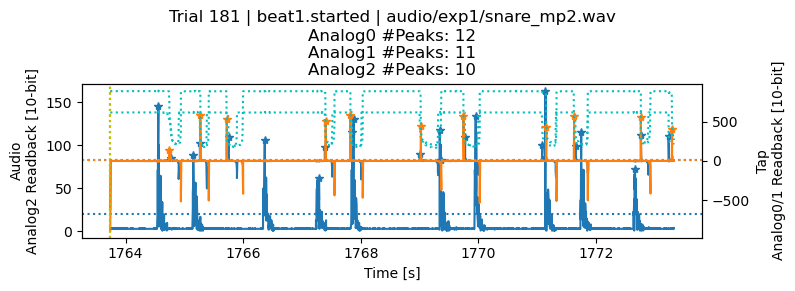

443545:444745
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [729 879]
Analog2 Peaks [indices]: [ 128  279  429  580  728  878 1029 1179]


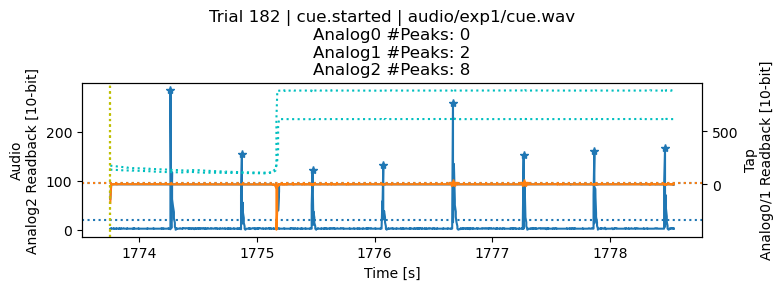

444741:447141
Analog0 Peaks [indices]: [ 193  345  598  919 1031 1331 1574 1837 1977 2262]
Analog1 Peaks [indices]: [ 185  341  598  916 1022 1329 1571 1829 1972 2262]
Analog2 Peaks [indices]: [ 201  351  651  882 1032 1404 1553 1855 2010 2228]


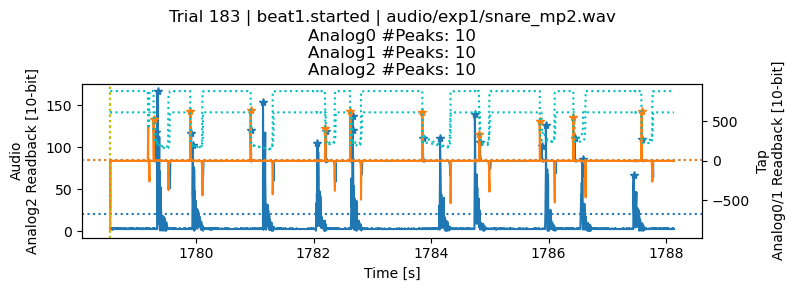

447245:448445
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [130 730]
Analog2 Peaks [indices]: [ 129  281  429  579  729  880 1030 1181]


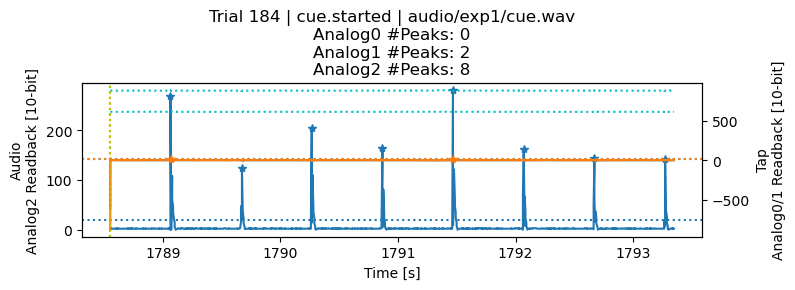

448445:450845
Analog0 Peaks [indices]: [ 156  346  585  903 1019 1288 1521 1823 1981 2274]
Analog1 Peaks [indices]: [ 146  331  571  894 1012 1260 1509 1802 1978 2265]
Analog2 Peaks [indices]: [ 206  359  653  879 1035 1407 1556 1855 2006 2237]


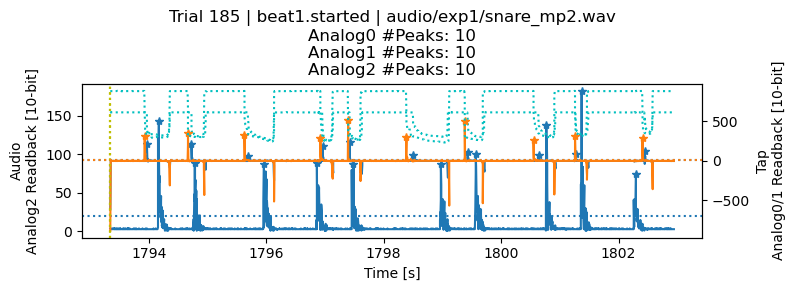

450945:452145
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [730]
Analog2 Peaks [indices]: [ 132  280  430  581  732  881 1032 1180]


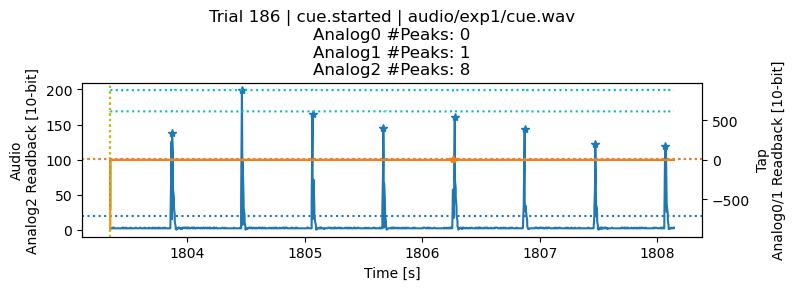

452144:454544
Analog0 Peaks [indices]: [ 138  330  601  921 1028 1308 1508 1819 1965 2279]
Analog1 Peaks [indices]: [ 145  320  581  920 1019 1297 1497 1783 1958 2276]
Analog2 Peaks [indices]: [ 204  354  658  883 1030 1409 1557 1860 2008 2230]


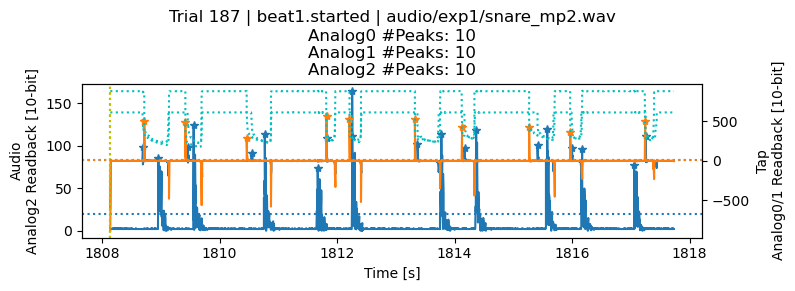

456649:457849
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: [ 132  280  430  580  732  881 1031 1182]


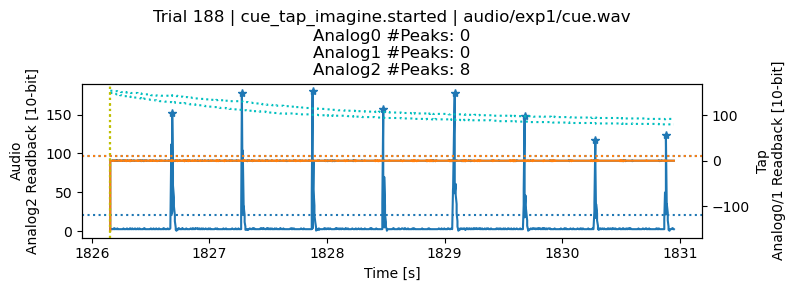

457849:460249
Analog0 Peaks [indices]: [ 139  293  617 1029 1176 1532 1697 2013 2155]
Analog1 Peaks [indices]: [ 138  294  624 1020 1176 1535 1693 2006 2155]
Analog2 Peaks [indices]: []


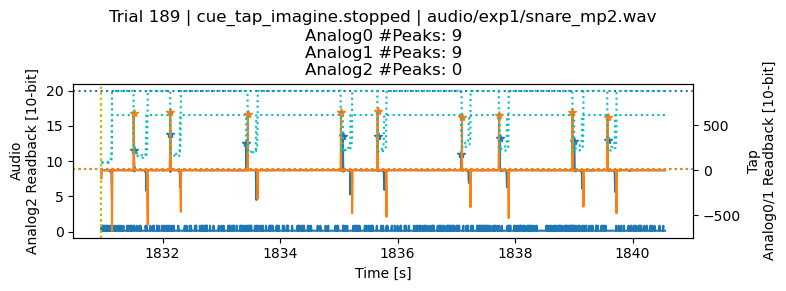

462348:463548
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: [133]
Analog2 Peaks [indices]: [ 132  282  432  583  734  883 1034 1182]


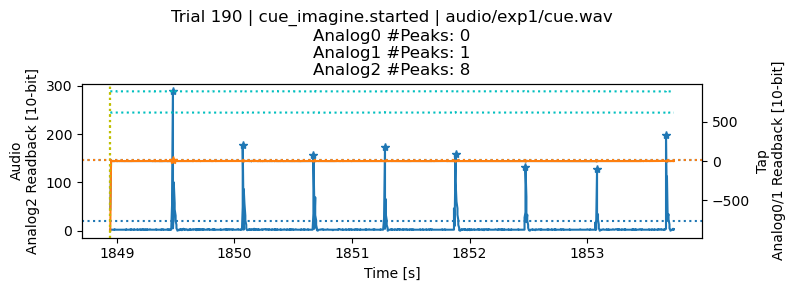

463549:465949
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


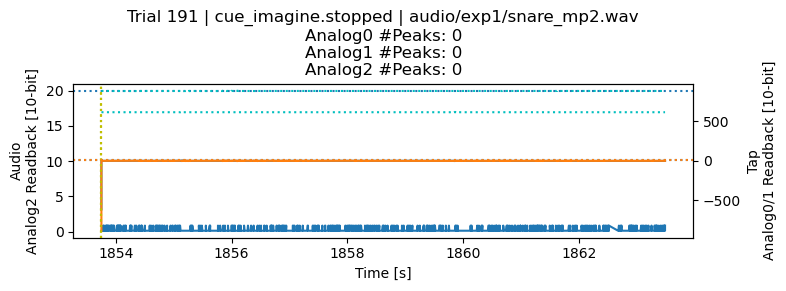

468048:469248
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


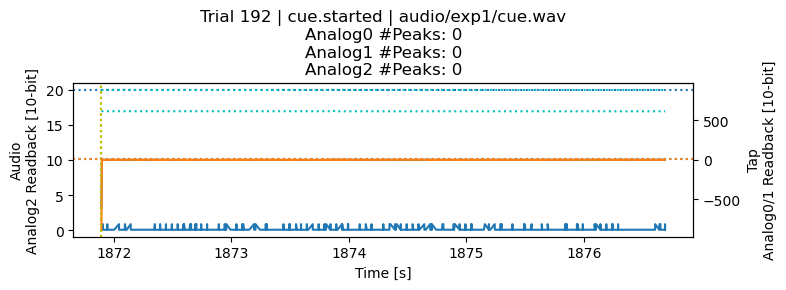

469244:471644
Analog0 Peaks [indices]: []
Analog1 Peaks [indices]: []
Analog2 Peaks [indices]: []


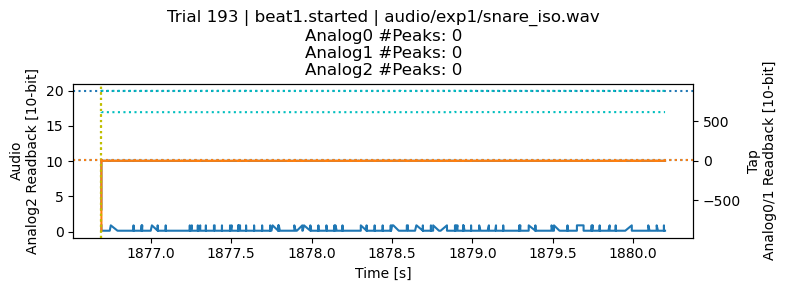

In [15]:
# Cyton params
FS_EEG = 250

stim_channel = [0]*len(data)

aux_channels = ['Analog0', 'Analog1', 'Analog2']

PEAK_HEIGHT = {}
PEAK_HEIGHT['Analog0'] = 10 # tap
PEAK_HEIGHT['Analog1'] = 10 # tap
PEAK_HEIGHT['Analog2'] = 20 # audio

IOI_CUE = 0.2 * FS_EEG
trial = 0

for ev in triggers:
    
    time_onset = ev[0]
    condition = ev[1]
    stim_path = ev[2]
    label = ev[3]
    
    START_NDX = TARGET_NDX + int(time_onset * FS_EEG)
    STOP_NDX = START_NDX + int(stim_duration[stim_path] * FS_EEG)
    #if START_NDX >= 125:
    #    START_NDX -= 125 # just in case int() rounded up, slide back by 0.5 seconds
    print(f'{START_NDX}:{STOP_NDX}')
    
    # Get sample times (how accurate are these?)
    t = data['Timestamp'].iloc[START_NDX:STOP_NDX]
    t = np.array(t) # make a numpy copy
    t -= data['Timestamp'].iloc[0] # start at t=0 

    # Get corresponding aux channels
    fig, ax_audio = plt.subplots(figsize=(8,2))
    ax_tap = ax_audio.twinx()
    title_str = f'Trial {trial} | {condition} | {stim_path}'

    for aux_ch in aux_channels:
        
        analog = data[aux_ch].iloc[START_NDX:STOP_NDX]
        analog = np.array(analog)
        # analog /= np.max(np.abs(analog)) # normalize
        if aux_ch in ['Analog0', 'Analog1']: # tap
            analog_copy = np.copy(analog)
            analog = convolve(analog, [-1, 1]) # look for negative edges
            analog = analog[:-1] # drop extra sample from conv
            # set plotting axis
            ax = ax_tap
        else:
            analog = analog - analog.mean()
            analog = np.abs(analog) # in case we miss a negative peak on downsampled audio
            # set plotting axis
            ax = ax_audio
            
        # Look for peaks in the cue segment
        peaks, _ = find_peaks(
            analog, # only use one of the two channels
            height=PEAK_HEIGHT[aux_ch], # the smaller metronome blips also exceed 0.5
            distance=IOI_CUE, # look for a peak in every 100ms, since events would happen every 0.5s @120bpm
        )
    
        print(f'{aux_ch} Peaks [indices]: {peaks}')
    
        # Plot peaks events
        line, = ax.plot(t, analog, '-')
        
        # 
        ax.plot(t[peaks], analog[peaks], '*', color=line.get_color())
        
        if aux_ch in ['Analog0', 'Analog1']:
            ax.plot(t, analog_copy, 'c:', )
            
        ax.axvline(x=t[0], c='y', linestyle=':')
        #plt.axvline(x=t[0] + CUE_DUR, c='c', linestyle=':')
        ax.axhline(y=PEAK_HEIGHT[aux_ch], linestyle=':', c=line.get_color())

        title_str += f'\n{aux_ch} #Peaks: {len(peaks)}'
        
        # Add trigger labels
        if (condition in cue_conditions) and (len(peaks)>0):
            if aux_ch == 'Analog2': # music
                p_onset = peaks[0] + START_NDX
                stim_channel[p_onset] = label + 1 # 1 for trial start (loud cue)

                p_onset = peaks[4] + START_NDX
                stim_channel[p_onset] = label + 2 # 2 for loud cue

                soft_cues = [1, 2, 3, 5, 6, 7]
                for p in peaks[soft_cues]:
                    p_onset = p + START_NDX
                    stim_channel[p_onset] = label + 3 # 3 for soft cue
            else: # tap channels
                for p in peaks:
                    p_onset = p + START_NDX
                    stim_channel[p_onset] = label + 7 + int(aux_ch[-1]) # 4/5 for taps
              
        else: # beat condition
            for p in peaks:
                p_onset = p + START_NDX
                if aux_ch == 'Analog2': # music
                    stim_channel[p_onset] = label + 4 # snare
                else: # tap channels
                    stim_channel[p_onset] = label + 7 + int(aux_ch[-1])
            
    ax_audio.set_title(title_str)
    ax_audio.set_xlabel('Time [s]')
    ax_audio.set_ylabel('Audio\nAnalog2 Readback [10-bit]')
    ax_tap.set_ylabel(f'Tap\nAnalog0/1 Readback [10-bit]')
    plt.show()
    
    trial += 1
    
data['stim'] = stim_channel # make a stim channel

<AxesSubplot: >

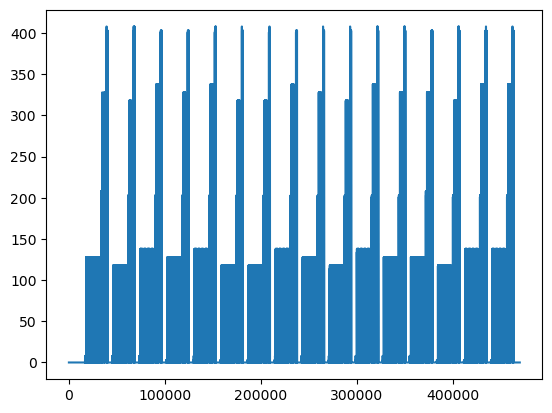

In [16]:
data['stim'].plot()

In [17]:
data['stim'][data['stim'] > 0].value_counts().sort_index()

1       64
2       64
3      384
7       76
8      120
114    320
117    283
118    314
124    240
127    230
128    241
134    240
137    231
138    249
201     16
202     16
203     96
207      7
208      9
317     68
318     76
327     49
328     51
337     52
338     57
401     16
402     16
403     96
408     18
Name: stim, dtype: int64

In [18]:
condition_labels

{'stimuli_name': -999,
 'cue.started': 0,
 'beat1.started': 100,
 'Tap_Imagine_instruction_2.started': -999,
 'cue_tap_imagine.started': 200,
 'cue_tap_imagine.stopped': 300,
 'cue_imagine.started': 400,
 'cue_imagine.stopped': 500}

In [19]:
stim_labels

{'audio/exp1/cue.wav': 1,
 'audio/exp1/snare_iso.wav': 10,
 'audio/exp1/snare_mp1.wav': 20,
 'audio/exp1/snare_mp2.wav': 30}

In [20]:
data.keys()

Index(['EXG0', 'EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG5', 'EXG6', 'EXG7',
       'Analog0', 'Analog1', 'Analog2', 'Timestamp', 'stim'],
      dtype='object')

# Write dataframe out

In [21]:
filname = f'{exp}_sub{subject_ID}_8ch_1stim.csv'
data.to_csv(filname)